## ITK ELASTIX IMPLEMENTATION FOR CT REGISTRATION WITH PREPROCESSING

### Team members
1. Taofik Ahmed Suleiman
2. Daniel Tweneboah Anyimadu

##### This project has been achieved in three key pipelines:
1. Data Processing and Visualization
2. CT Lung Preprocessing
3. Registration using Elastix and Transformix 

In [1]:
# IMPORT ALL NEEDED LIBRARIES

import os
import SimpleITK as sitk
import matplotlib.pyplot as plt
import numpy as np
import itk

# Import necessary libraries from the external documents
from CT_Lung_Preprocessing import CTPreprocessing
from data_preparation import RawToITKConverter, clean_output_points, compare_landmarks

c:\Users\sulei\anaconda3\lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
c:\Users\sulei\anaconda3\lib\site-packages\numpy\.libs\libopenblas64__v0.3.21-gcc_10_3_0.dll
c:\Users\sulei\anaconda3\lib\site-packages\numpy\.libs\libopenblas64__v0.3.23-gcc_10_3_0.dll
  warnings.warn("loaded more than 1 DLL from .libs:"


### 1. Data processing and visualization

We created a class called RawToITKConverter where all the processing and visualization of the data is done (check data_preparation.py).


Steps:
1. convert_raw_to_ITK_readable Function: This function is used to convert the raw data to any ITK readable format we want.
2. convert_raw_files_to_nifti Function: This function is used to convert our processed to file to nifty format. 
3. visualize_all_position Function: This function is used to visualize the data in all planes (axial, sagittal and corona views)
4. visualize_with_landmarks Function: This function is used to visualize the data with its landmark to have a view of the lanmark positions in the images.


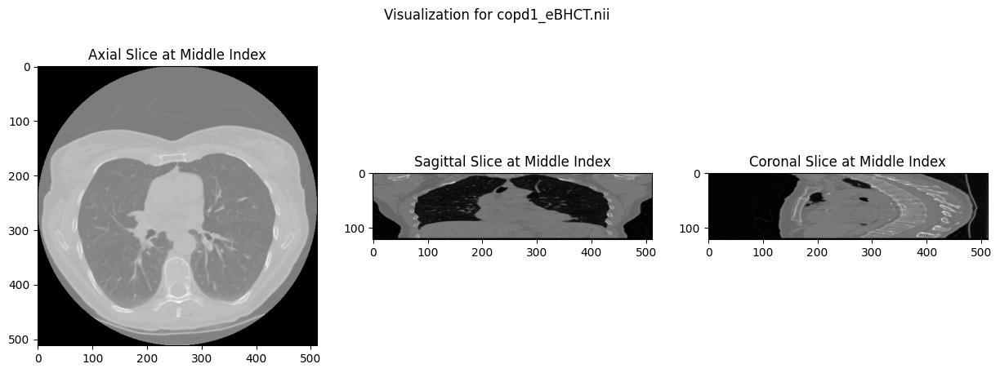

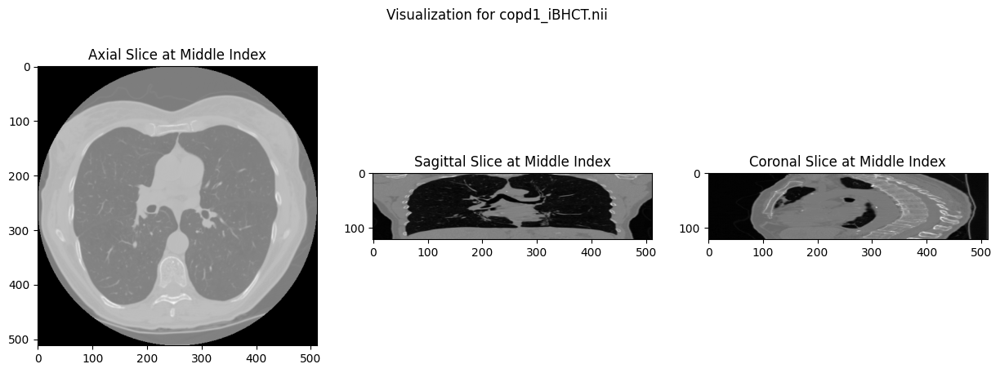

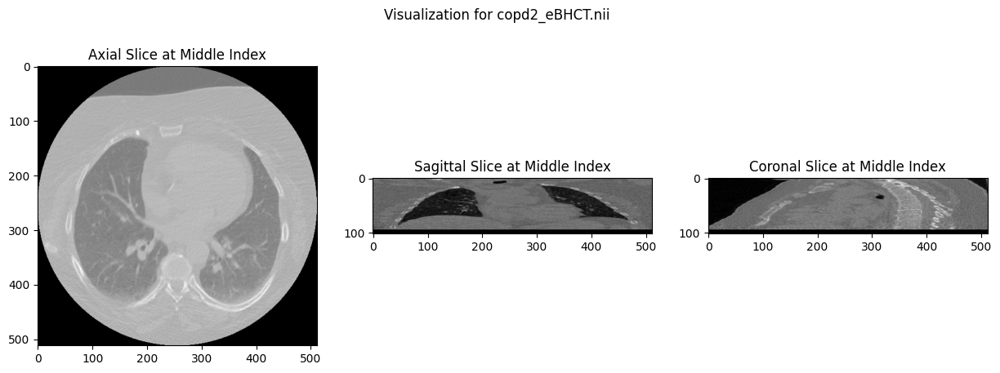

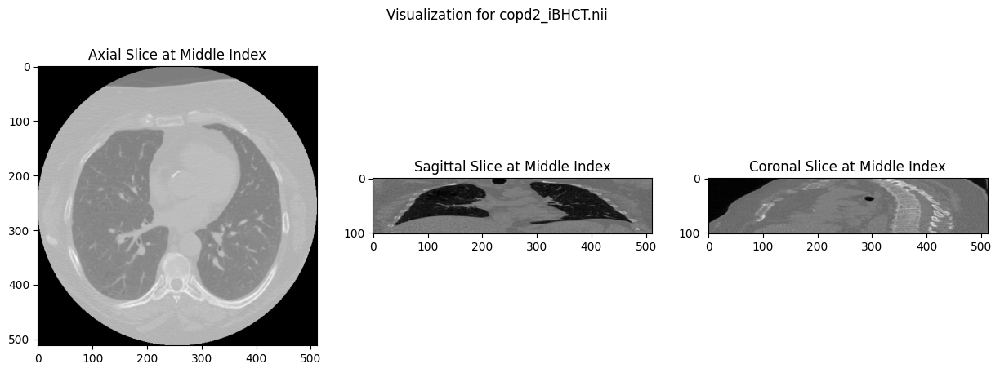

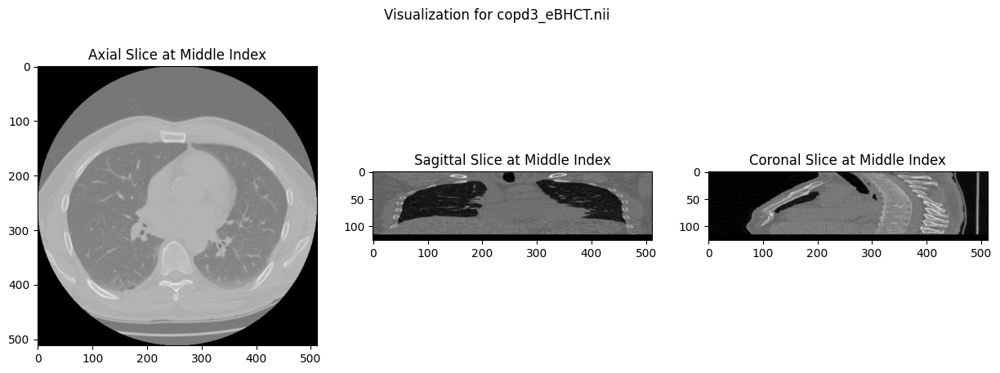

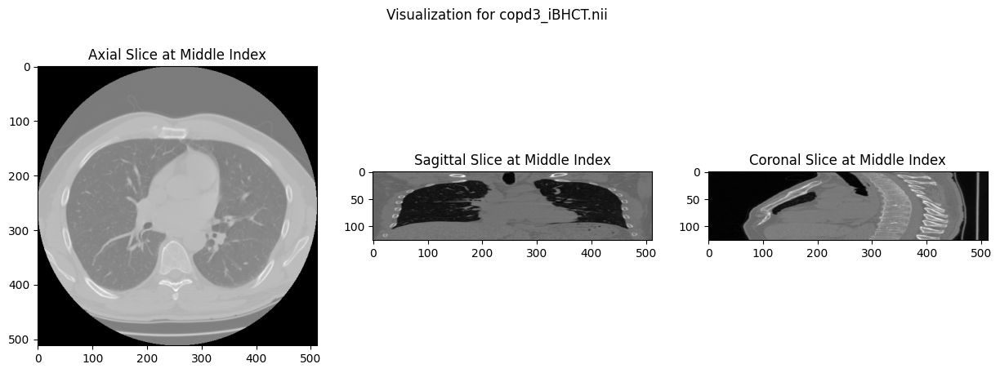

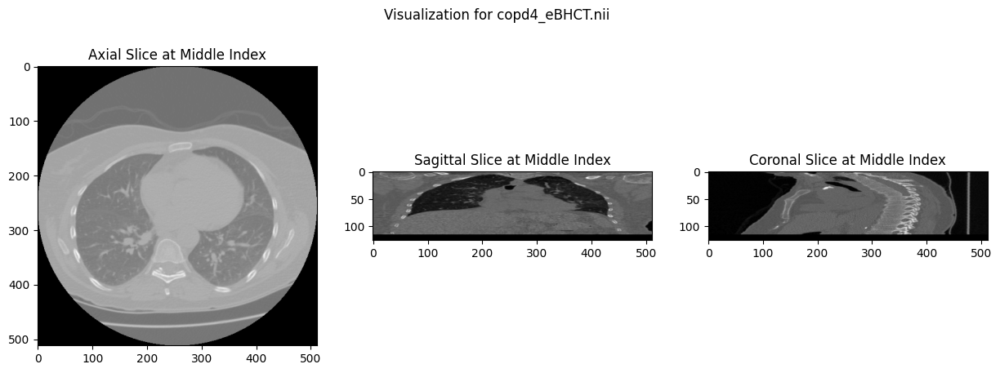

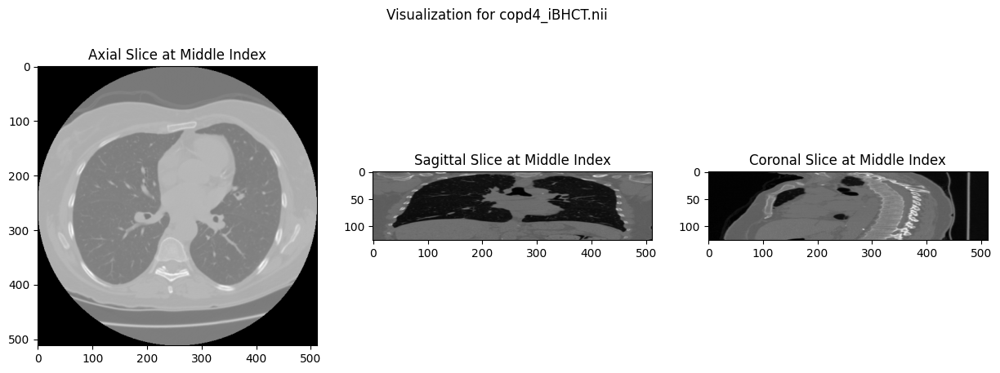

In [6]:
# Provide the needed paths for our class
folder1 = r"C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\copd1"
folder2 = r"C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\copd2"
folder3 = r"C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train34\copd3"
folder4 = r"C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train34\copd4"

output = r"C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\new"

# Instance of the RawToITKConverter class
converter = RawToITKConverter()

# Convert all .img files in the folders to nifty
converter.convert_raw_files_to_nifti(folder1, output, image_size=(512, 512, 121))
converter.convert_raw_files_to_nifti(folder2, output, image_size=(512, 512, 102))
converter.convert_raw_files_to_nifti(folder3, output, image_size=(512, 512, 126))
converter.convert_raw_files_to_nifti(folder4, output, image_size=(512, 512, 126))

# Visualize all positions
converter.visualize_all_position(output)

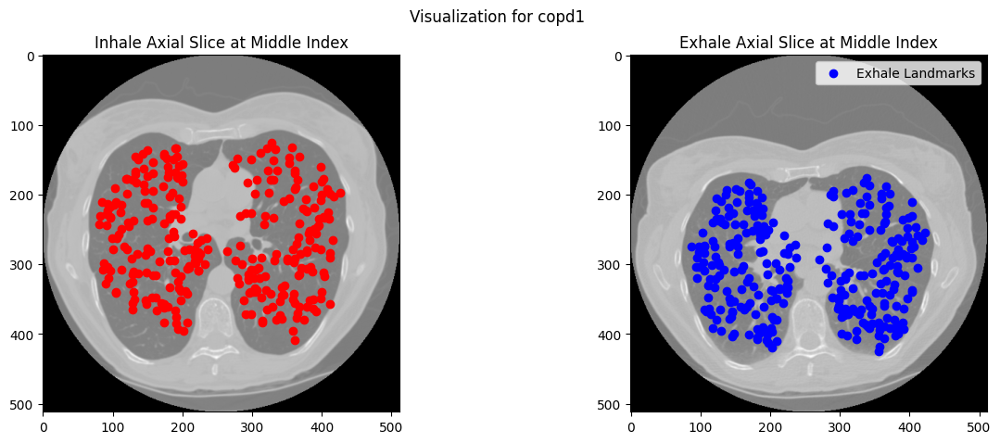

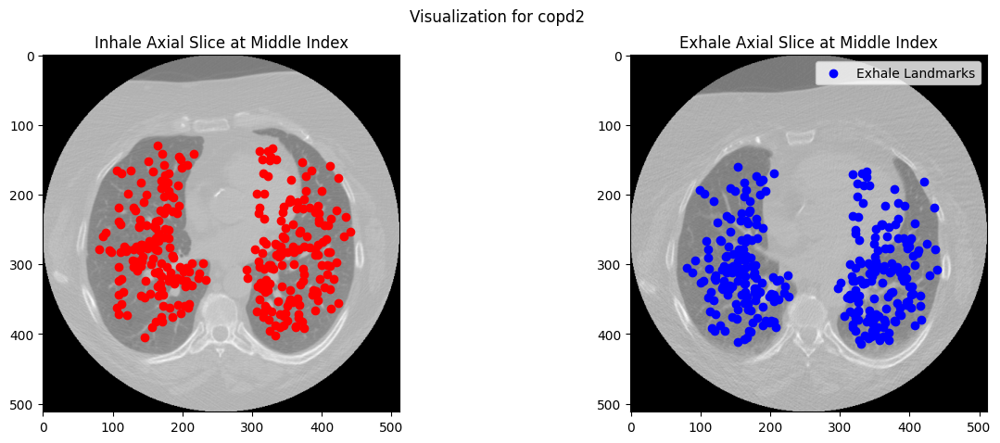

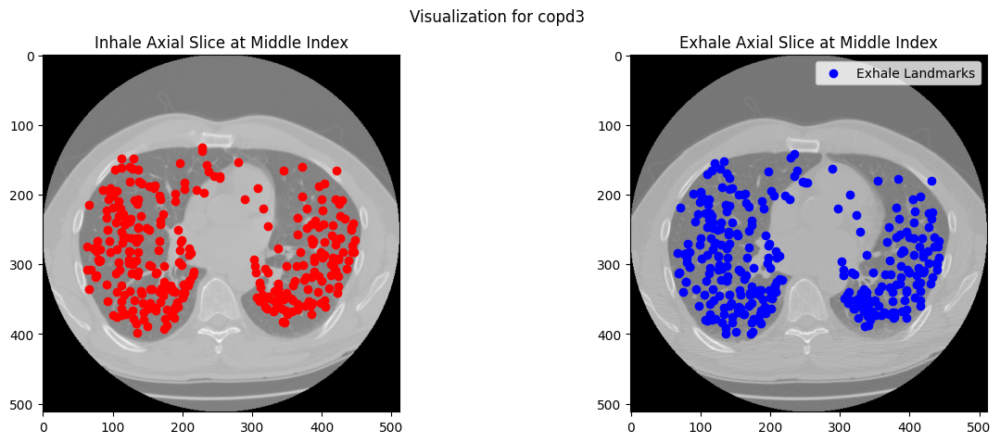

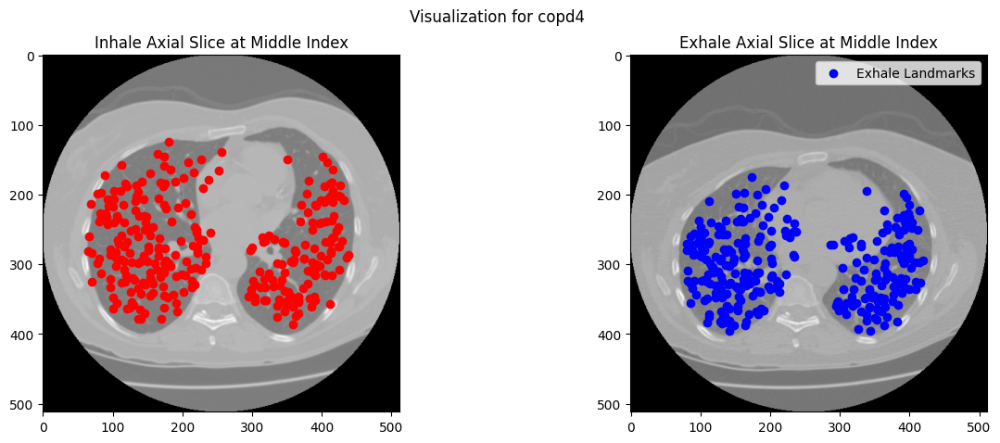

In [7]:
converter.visualize_with_landmarks(output)

### 2. CT Lung Preprocessing

We created a class called CTPreprocessing where all the preprocessing and segmentation of the gantry (circular region) is implemented (check CT_Lung_Preprocessing.py)


Steps:
1. apply_CLAHE Function: This function is used for normalization and perform contrast-limited adaptive histogram equalization (CLAHE)
2. chest_hole_filling Function: The primary purpose of this function is fill the cavity within the identified contours. 
3. remove_gantry Function: This function is used to remove the circular region of the image
4. segment_kmeans Function: This function is used to segment the region surrounding the lungs, this will guide us in the gantry removal.
5. remove_gantry Function: This function is used to remove the circular region of the image
6. check_fov Function: This function is usedf to check if intensity in at least 3 corners is below our specified threshold for the segmentation.


Fov presence: True


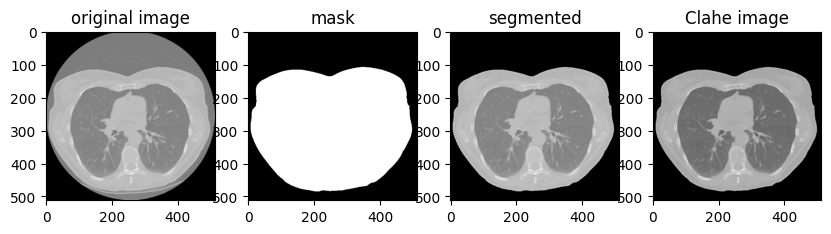


Fov presence: True


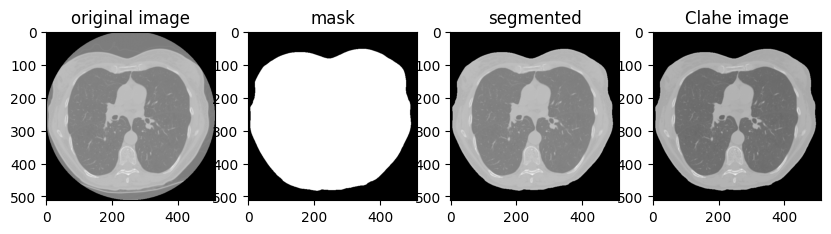


Fov presence: True


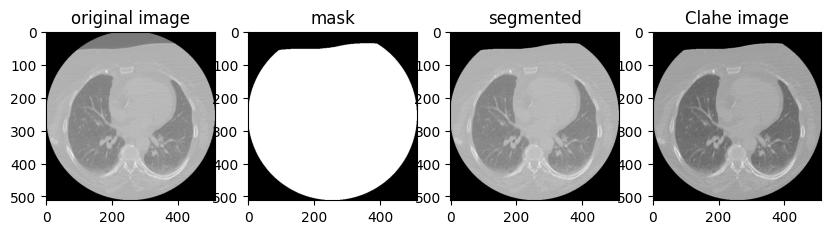


Fov presence: True


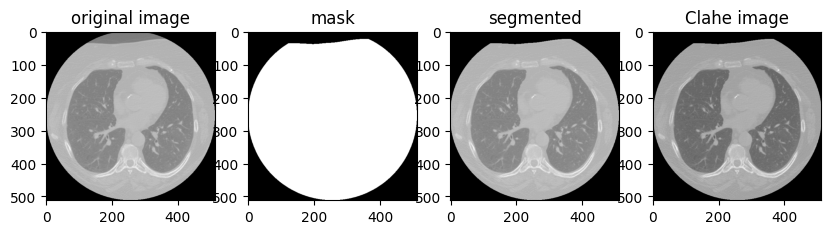


Fov presence: True


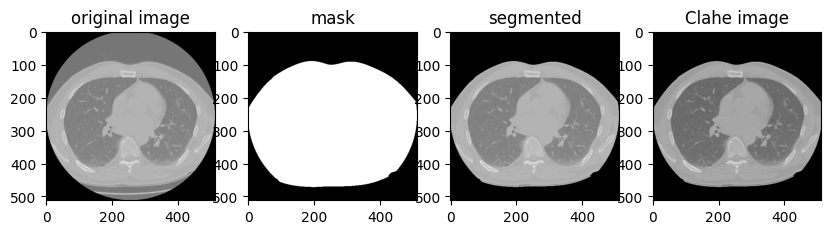


Fov presence: True


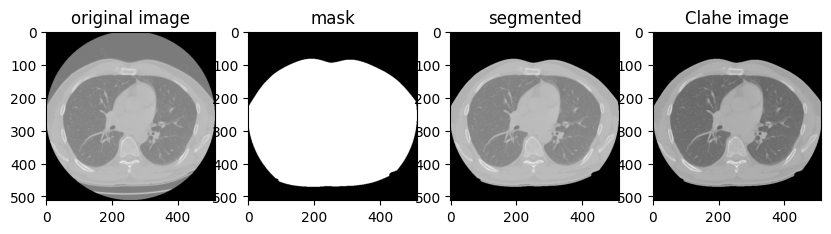


Fov presence: True


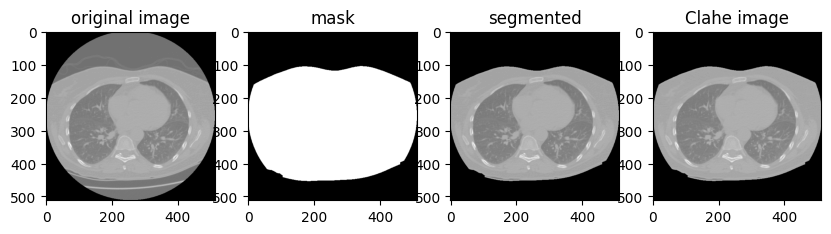


Fov presence: True


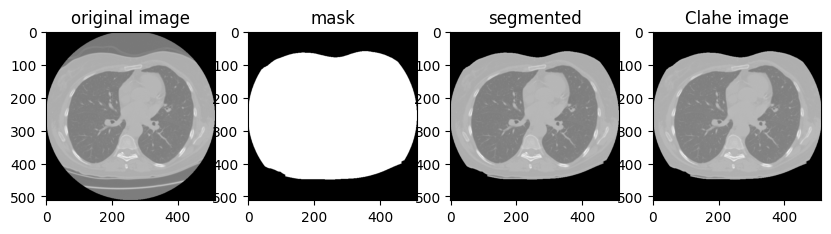

In [9]:
removedG_folder = r'C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\removedG'
output_folder = r'C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\new'

# Instance of CTPreprocessing
ct_preprocessor = CTPreprocessing(output_folder, removedG_folder)

nii_files = [file for file in os.listdir(output_folder) if file.endswith('.nii')]

# Process each file and perform all preprocessing
for nii_file in nii_files:
    input_path = os.path.join(output_folder, nii_file)

    ct_image = sitk.ReadImage(input_path)
    img_255 = sitk.Cast(sitk.RescaleIntensity(ct_image), sitk.sitkUInt8)
    seg_img = sitk.GetArrayFromImage(img_255)

    if ct_preprocessor.check_fov(sitk.GetArrayFromImage(ct_image)):
        segmented = ct_preprocessor.segment_kmeans(seg_img)
        print("\nFov presence: True")
    else:
        segmented = ct_preprocessor.segment_kmeans(seg_img, K=2)
        print("\nFov presence: False")

    removed, gantry_mask = ct_preprocessor.remove_gantry(seg_img, segmented)
    preprocessed = ct_preprocessor.apply_CLAHE(removed)

    
    output_path = os.path.join(removedG_folder, nii_file)

    removed_image = sitk.GetImageFromArray(removed)
    preprocessed_image = sitk.GetArrayFromImage(preprocessed)

    # Save the processed image to the removedG folder
    # sitk.WriteImage(preprocessed , output_path)

    fig, ax = plt.subplots(1, 4, figsize=(10, 5))

    ax[0].imshow(seg_img[60, :, :], cmap="gray")
    ax[0].set_title("original image")

    ax[1].imshow(gantry_mask[60, :, :], cmap="gray")
    ax[1].set_title("mask")

    ax[2].imshow(removed[60, :, :], cmap="gray")
    ax[2].set_title("segmented")

    ax[3].imshow(preprocessed_image[60, :, :], cmap="gray")
    ax[3].set_title("Clahe image")

    plt.show()

##### Calculate TRE without registration

In [13]:
voxel_sizes = {
    "copd1": np.array([0.625, 0.625, 2.5]),
    "copd2": np.array([0.645, 0.645, 2.5]),
    "copd3": np.array([0.652, 0.652, 2.5]),
    "copd4": np.array([0.590, 0.590, 2.5]),
}

# Compare landmarks and compute TRE
compare_landmarks(output, voxel_sizes)

TRE for copd1:
Mean TRE: 26.33 mm
Std TRE: 11.42 mm

TRE for copd2:
Mean TRE: 21.79 mm
Std TRE: 6.46 mm

TRE for copd3:
Mean TRE: 12.64 mm
Std TRE: 6.38 mm

TRE for copd4:
Mean TRE: 29.58 mm
Std TRE: 12.92 mm



### 3. Registration using Elastix and Transformix 

We did the registration using different transformation parameters from the zoo file and itk documentation inbuilt transformation files


Steps:
1. Read the fixed and moving images using the itk library with reference to the naming system of our data.
2. Set up Parameter Object: We used several parameter objects for the registration
3. Call Registration Function: We used the elastix_registration_method to perform the image registration.
4. Perform Transformix: We used the transformix_pointset function to transform points from the moving image space to the fixed image space.
5. Clean Output Points: We processed and cleaned the output points from transformix using the clean_output_points function (check data_preparation.py).
6. Visualize the result of the registered images

In [29]:
# Define the input and output directories
input_directory = r'C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\removedG'
output_directory = r'C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\outseg'

# Get a list of all files in the input directory
file_list = [f for f in os.listdir(input_directory) if f.endswith('_iBHCT.nii')]


Registration using inbuilt Affine and Bspline from ITK

Output points extracted and saved to C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\outseg\copd1_300_iBH_xyz_r1\copd1_300_iBH_xyz_r1.txt


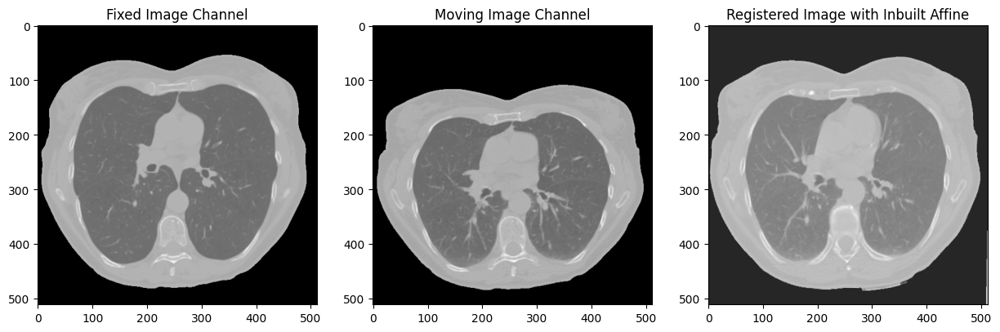

Output points extracted and saved to C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\outseg\copd2_300_iBH_xyz_r1\copd2_300_iBH_xyz_r1.txt


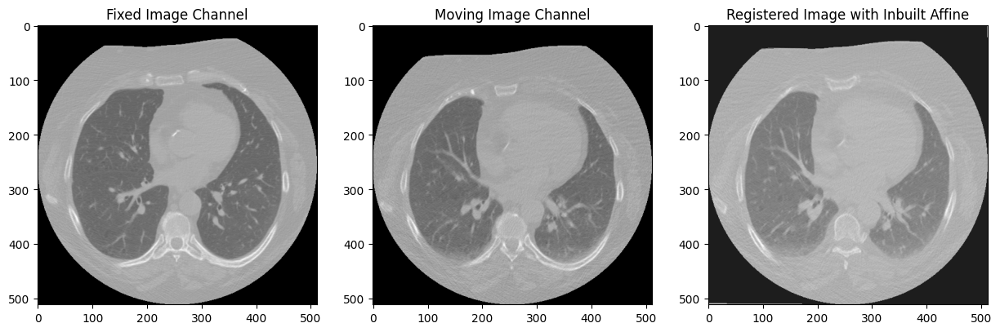

Output points extracted and saved to C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\outseg\copd3_300_iBH_xyz_r1\copd3_300_iBH_xyz_r1.txt


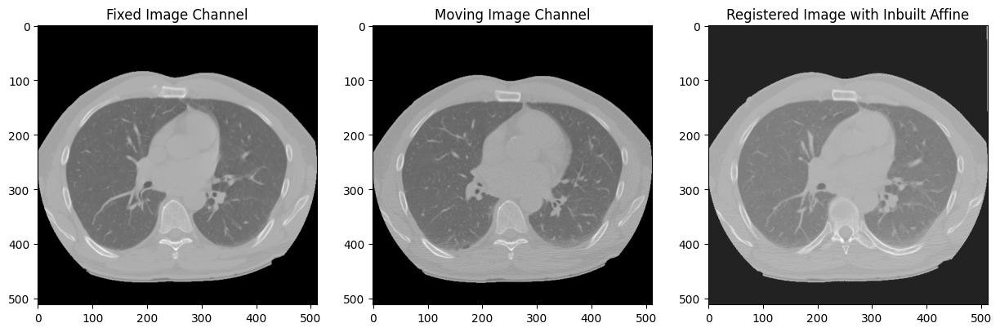

Output points extracted and saved to C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\outseg\copd4_300_iBH_xyz_r1\copd4_300_iBH_xyz_r1.txt


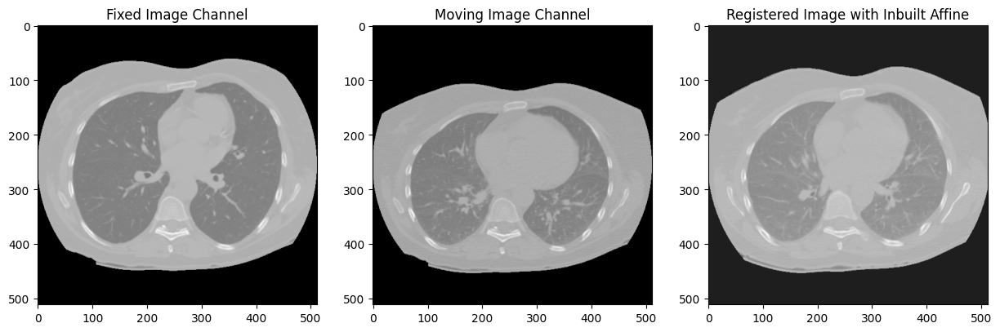

In [31]:
for fixed_image_name in file_list:
    # Construct the file paths for fixed and moving images
    fixed_image_path = os.path.join(input_directory, fixed_image_name)
    moving_image_path = os.path.join(input_directory, fixed_image_name.replace('_iBHCT', '_eBHCT'))

    # Extract case name from the fixed image name
    case_name = fixed_image_name.split('_')[0]

    # Create the output subfolder structure
    output_subfolder = os.path.join(output_directory, '{}_300_iBH_xyz_r1'.format(case_name))
    os.makedirs(output_subfolder, exist_ok=True)

    # Read images
    fixed_image = itk.imread(fixed_image_path, itk.F) 
    moving_image = itk.imread(moving_image_path, itk.F)

    # Set up parameter object
    parameter_object = itk.ParameterObject.New()
    default_rigid_parameter_map = parameter_object.GetDefaultParameterMap('affine')
    parameter_object.AddParameterMap(default_rigid_parameter_map)

    # Call registration function
    result_image, result_transform_parameters = itk.elastix_registration_method(
        fixed_image, moving_image,
        parameter_object=parameter_object,
        log_to_console=False)

    # Perform transformix
    result_point_set = itk.transformix_pointset(
        moving_image, result_transform_parameters,
        fixed_point_set_file_name=os.path.join(input_directory, fixed_image_name.replace('_iBHCT.nii', '_300_iBH_xyz_r1.txt')),
        output_directory=output_subfolder)
    
     # Clean the output points
    clean_output_points(os.path.join(output_subfolder, 'outputpoints.txt'), os.path.join(output_subfolder, fixed_image_name.replace('_iBHCT.nii', '_300_iBH_xyz_r1.txt')))

    # Visualize the result
    channel_to_display = 60

    fixed_channel_array = itk.GetArrayFromImage(fixed_image)[channel_to_display, :, :]
    moving_channel_array = itk.GetArrayFromImage(moving_image)[channel_to_display, :, :]
    result_channel_array = itk.GetArrayViewFromImage(result_image)[channel_to_display, :, :]

    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(fixed_channel_array, cmap='gray')
    plt.title('Fixed Image Channel')

    plt.subplot(1, 3, 2)
    plt.imshow(moving_channel_array, cmap='gray')
    plt.title('Moving Image Channel')

    plt.subplot(1, 3, 3)
    plt.imshow(result_channel_array, cmap='gray')
    plt.title('Registered Image with Inbuilt Affine')

    plt.show()


In [32]:
TRE_folder = r'C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\Compare'

voxel_sizes = {
    "copd1": np.array([0.625, 0.625, 2.5]),
    "copd2": np.array([0.645, 0.645, 2.5]),
    "copd3": np.array([0.652, 0.652, 2.5]),
    "copd4": np.array([0.590, 0.590, 2.5]),
}

# Compare landmarks and compute TRE
compare_landmarks(TRE_folder, voxel_sizes)

TRE for copd1:
Mean TRE: 14.66 mm
Std TRE: 6.45 mm

TRE for copd2:
Mean TRE: 21.61 mm
Std TRE: 5.60 mm

TRE for copd3:
Mean TRE: 5.38 mm
Std TRE: 3.17 mm

TRE for copd4:
Mean TRE: 16.27 mm
Std TRE: 7.27 mm



Output points extracted and saved to C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\outseg\copd1_300_iBH_xyz_r1\copd1_300_iBH_xyz_r1.txt


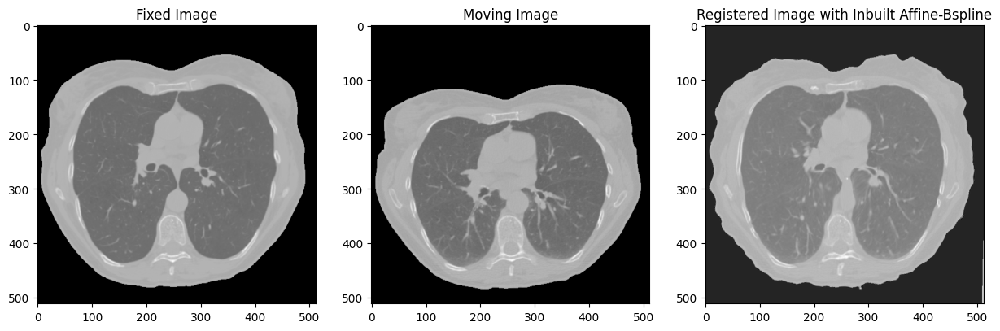

Output points extracted and saved to C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\outseg\copd2_300_iBH_xyz_r1\copd2_300_iBH_xyz_r1.txt


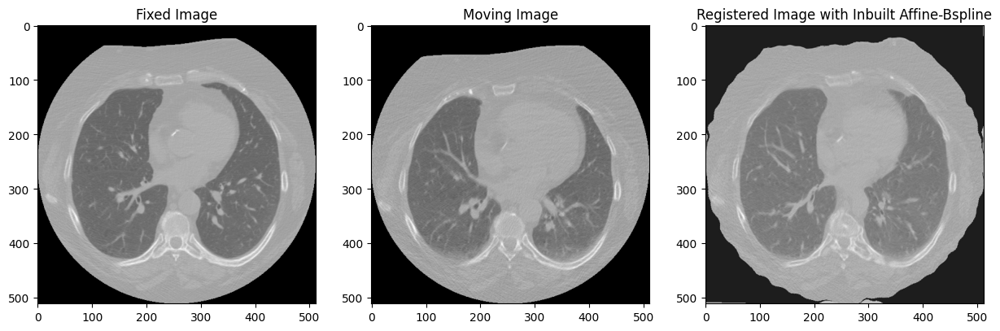

Output points extracted and saved to C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\outseg\copd3_300_iBH_xyz_r1\copd3_300_iBH_xyz_r1.txt


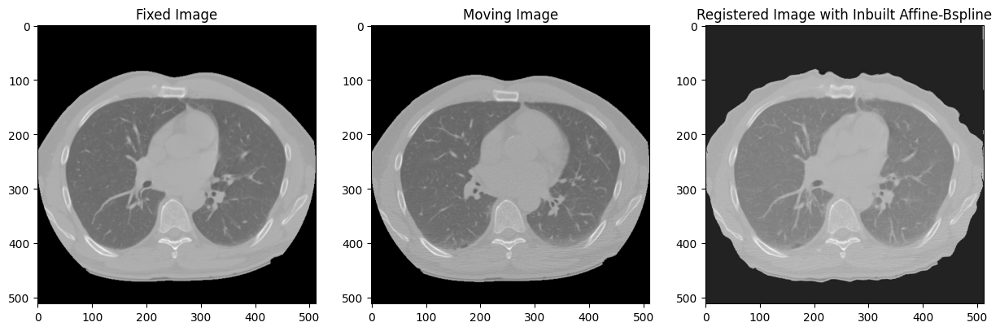

Output points extracted and saved to C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\outseg\copd4_300_iBH_xyz_r1\copd4_300_iBH_xyz_r1.txt


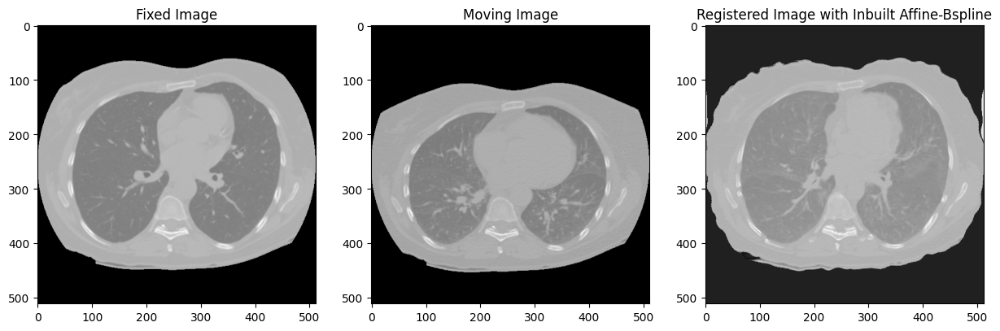

In [26]:
# Iterate over each fixed image in the list
for fixed_image_name in file_list:
    # Construct the file paths for fixed and moving images
    fixed_image_path = os.path.join(input_directory, fixed_image_name)
    moving_image_path = os.path.join(input_directory, fixed_image_name.replace('_iBHCT', '_eBHCT'))

    # Extract case name from the fixed image name
    case_name = fixed_image_name.split('_')[0]

    # Create the output subfolder structure
    output_subfolder = os.path.join(output_directory, '{}_300_iBH_xyz_r1'.format(case_name))
    os.makedirs(output_subfolder, exist_ok=True)

    # Read images
    fixed_image = itk.imread(fixed_image_path, itk.F) 
    moving_image = itk.imread(moving_image_path, itk.F)

    # Set up parameter object
    parameter_object = itk.ParameterObject.New()
    default_rigid_parameter_map = parameter_object.GetDefaultParameterMap('affine')
    parameter_object.AddParameterMap(default_rigid_parameter_map)
    default_rigid_parameter_map2 = parameter_object.GetDefaultParameterMap('bspline')
    parameter_object.AddParameterMap(default_rigid_parameter_map2)

    # Call registration function
    result_image, result_transform_parameters = itk.elastix_registration_method(
        fixed_image, moving_image,
        parameter_object=parameter_object,
        log_to_console=False)

    # Perform transformix
    result_point_set = itk.transformix_pointset(
        moving_image, result_transform_parameters,
        fixed_point_set_file_name=os.path.join(input_directory, fixed_image_name.replace('_iBHCT.nii', '_300_iBH_xyz_r1.txt')),
        output_directory=output_subfolder)
    
     # Clean the output points
    clean_output_points(os.path.join(output_subfolder, 'outputpoints.txt'), os.path.join(output_subfolder, fixed_image_name.replace('_iBHCT.nii', '_300_iBH_xyz_r1.txt')))

    # Visualize the result
    channel_to_display = 60

    fixed_channel_array = itk.GetArrayFromImage(fixed_image)[channel_to_display, :, :]
    moving_channel_array = itk.GetArrayFromImage(moving_image)[channel_to_display, :, :]
    result_channel_array = itk.GetArrayViewFromImage(result_image)[channel_to_display, :, :]

    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(fixed_channel_array, cmap='gray')
    plt.title('Fixed Image')

    plt.subplot(1, 3, 2)
    plt.imshow(moving_channel_array, cmap='gray')
    plt.title('Moving Image')

    plt.subplot(1, 3, 3)
    plt.imshow(result_channel_array, cmap='gray')
    plt.title('Registered Image with Inbuilt Affine-Bspline')

    plt.show()


In [27]:
TRE_folder = r'C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\Compare'

voxel_sizes = {
    "copd1": np.array([0.625, 0.625, 2.5]),
    "copd2": np.array([0.645, 0.645, 2.5]),
    "copd3": np.array([0.652, 0.652, 2.5]),
    "copd4": np.array([0.590, 0.590, 2.5]),
}

# Compare landmarks and compute TRE
compare_landmarks(TRE_folder, voxel_sizes)

TRE for copd1:
Mean TRE: 12.69 mm
Std TRE: 5.94 mm

TRE for copd2:
Mean TRE: 18.50 mm
Std TRE: 7.48 mm

TRE for copd3:
Mean TRE: 5.14 mm
Std TRE: 4.11 mm

TRE for copd4:
Mean TRE: 15.31 mm
Std TRE: 7.24 mm



Registration using parameter 49 from zoo files

Output points extracted and saved to C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\outseg\copd1_300_iBH_xyz_r1\copd1_300_iBH_xyz_r1.txt


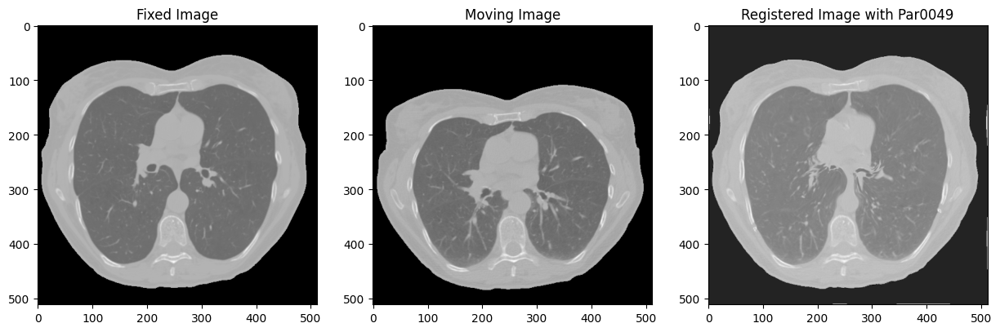

Output points extracted and saved to C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\outseg\copd2_300_iBH_xyz_r1\copd2_300_iBH_xyz_r1.txt


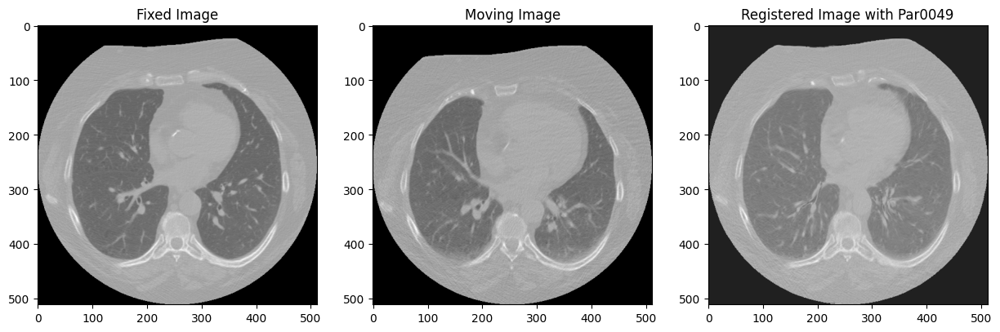

Output points extracted and saved to C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\outseg\copd3_300_iBH_xyz_r1\copd3_300_iBH_xyz_r1.txt


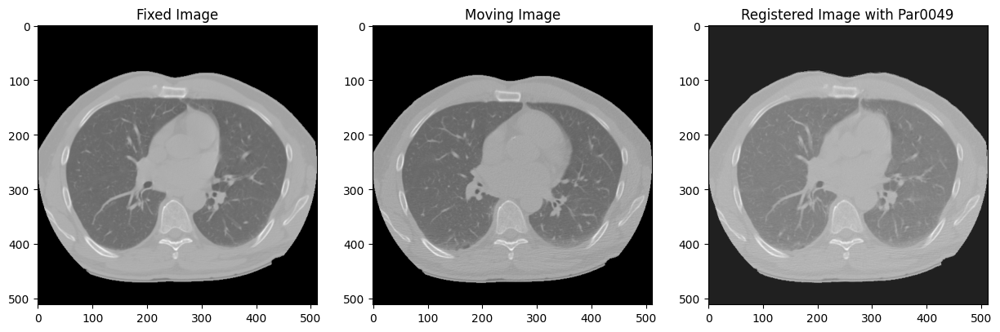

Output points extracted and saved to C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\outseg\copd4_300_iBH_xyz_r1\copd4_300_iBH_xyz_r1.txt


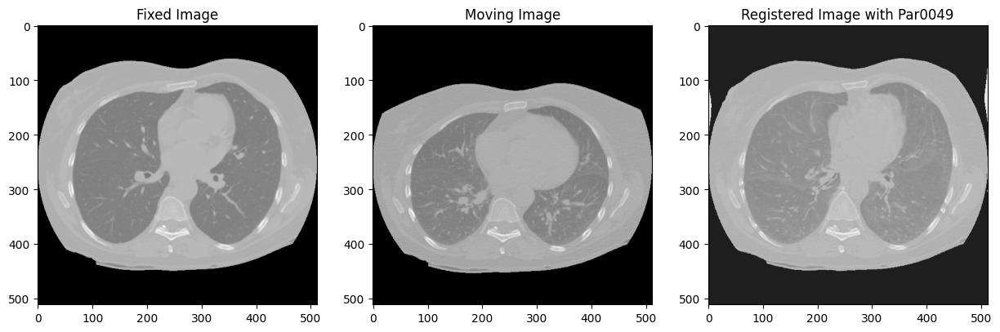

In [28]:
# Iterate over each fixed image in the list
for fixed_image_name in file_list:
    # Construct the file paths for fixed and moving images
    fixed_image_path = os.path.join(input_directory, fixed_image_name)
    moving_image_path = os.path.join(input_directory, fixed_image_name.replace('_iBHCT', '_eBHCT'))

    # Extract case name from the fixed image name
    case_name = fixed_image_name.split('_')[0]

    # Create the output subfolder structure
    output_subfolder = os.path.join(output_directory, '{}_300_iBH_xyz_r1'.format(case_name))
    os.makedirs(output_subfolder, exist_ok=True)

    # Read images
    fixed_image = itk.imread(fixed_image_path, itk.F)
    moving_image = itk.imread(moving_image_path, itk.F)

    # Set up parameter object
    parameter_object = itk.ParameterObject.New()
    
    parameter_object.AddParameterFile(r'C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\Parameter\Par0049_stdT2000itr.txt')
    parameter_object.AddParameterFile(r'C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\Parameter\Par0049_stdTL.txt')
    parameter_object.AddParameterFile(r'C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\Parameter\Par0049_stdT-advanced.txt')
    parameter_object.AddParameterFile(r'C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\Parameter\Par0049_stdTL-advanced.txt')

    # Call registration function
    result_image, result_transform_parameters = itk.elastix_registration_method(
        fixed_image, moving_image,
        parameter_object=parameter_object,
        log_to_console=False)

    # Perform transformix
    result_point_set = itk.transformix_pointset(
        moving_image, result_transform_parameters,
        fixed_point_set_file_name=os.path.join(input_directory, fixed_image_name.replace('_iBHCT.nii', '_300_iBH_xyz_r1.txt')),
        output_directory=output_subfolder)

    # Clean the output points
    clean_output_points(os.path.join(output_subfolder, 'outputpoints.txt'), os.path.join(output_subfolder, fixed_image_name.replace('_iBHCT.nii', '_300_iBH_xyz_r1.txt')))

    # Visualize the result
    channel_to_display = 60

    fixed_channel_array = itk.GetArrayFromImage(fixed_image)[channel_to_display, :, :]
    moving_channel_array = itk.GetArrayFromImage(moving_image)[channel_to_display, :, :]
    result_channel_array = itk.GetArrayViewFromImage(result_image)[channel_to_display, :, :]

    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(fixed_channel_array, cmap='gray')
    plt.title('Fixed Image')

    plt.subplot(1, 3, 2)
    plt.imshow(moving_channel_array, cmap='gray')
    plt.title('Moving Image')

    plt.subplot(1, 3, 3)
    plt.imshow(result_channel_array, cmap='gray')
    plt.title('Registered Image with Par0049')

    plt.show()


In [30]:
TRE_folder = r'C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\Compare'

voxel_sizes = {
    "copd1": np.array([0.625, 0.625, 2.5]),
    "copd2": np.array([0.645, 0.645, 2.5]),
    "copd3": np.array([0.652, 0.652, 2.5]),
    "copd4": np.array([0.590, 0.590, 2.5]),
}

# Compare landmarks and compute TRE
compare_landmarks(TRE_folder, voxel_sizes)

TRE for copd1:
Mean TRE: 18.72 mm
Std TRE: 9.68 mm

TRE for copd2:
Mean TRE: 18.10 mm
Std TRE: 8.13 mm

TRE for copd3:
Mean TRE: 4.52 mm
Std TRE: 4.34 mm

TRE for copd4:
Mean TRE: 17.45 mm
Std TRE: 6.98 mm



Registration using parameter 11 from zoo files 

Output points extracted and saved to C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\outseg\copd1_300_iBH_xyz_r1\copd1_300_iBH_xyz_r1.txt


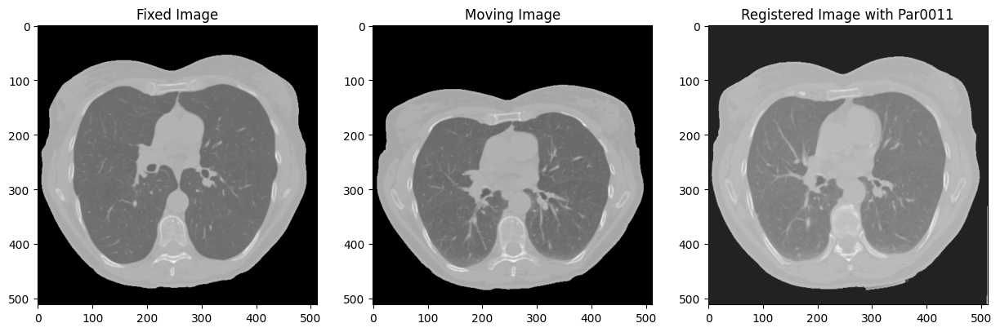

Output points extracted and saved to C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\outseg\copd2_300_iBH_xyz_r1\copd2_300_iBH_xyz_r1.txt


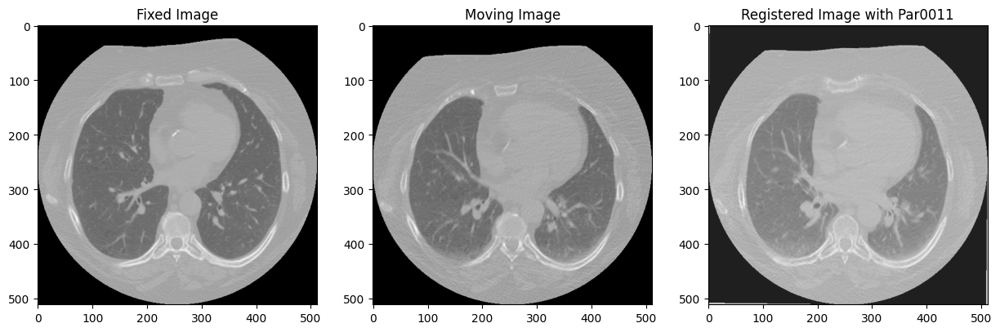

Output points extracted and saved to C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\outseg\copd3_300_iBH_xyz_r1\copd3_300_iBH_xyz_r1.txt


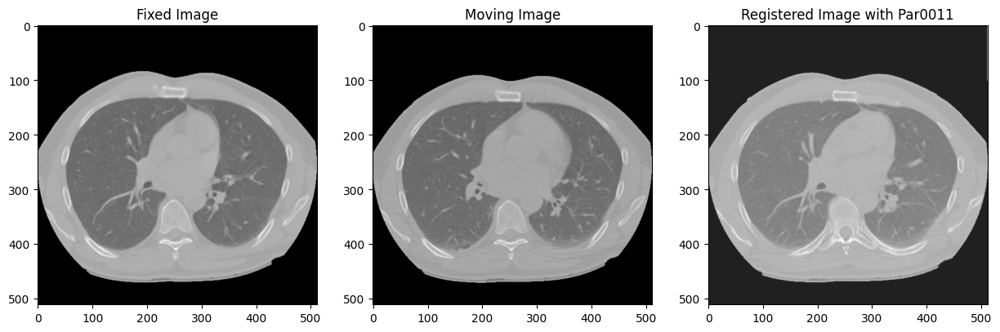

Output points extracted and saved to C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\outseg\copd4_300_iBH_xyz_r1\copd4_300_iBH_xyz_r1.txt


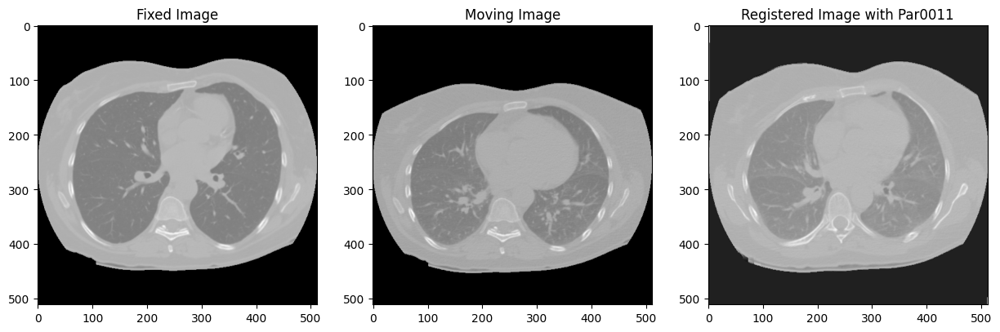

In [33]:
# Iterate over each fixed image in the list
for fixed_image_name in file_list:
    # Construct the file paths for fixed and moving images
    fixed_image_path = os.path.join(input_directory, fixed_image_name)
    moving_image_path = os.path.join(input_directory, fixed_image_name.replace('_iBHCT', '_eBHCT'))

    # Extract case name from the fixed image name
    case_name = fixed_image_name.split('_')[0]

    # Create the output subfolder structure
    output_subfolder = os.path.join(output_directory, '{}_300_iBH_xyz_r1'.format(case_name))
    os.makedirs(output_subfolder, exist_ok=True)

    # Read images
    fixed_image = itk.imread(fixed_image_path, itk.F)
    moving_image = itk.imread(moving_image_path, itk.F)

    # Set up parameter object
    parameter_object = itk.ParameterObject.New()
    
    parameter_object.AddParameterFile(r'C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\Parameter\Parameters.Par0011.affine.txt')
    parameter_object.AddParameterFile(r'C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\Parameter\Parameters.Par0011.bspline1_s.txt')
    parameter_object.AddParameterFile(r'C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\Parameter\Parameters.Par0011.bspline2_s.txt')

    # Call registration function
    result_image, result_transform_parameters = itk.elastix_registration_method(
        fixed_image, moving_image,
        parameter_object=parameter_object,
        log_to_console=False)

    # Perform transformix
    result_point_set = itk.transformix_pointset(
        moving_image, result_transform_parameters,
        fixed_point_set_file_name=os.path.join(input_directory, fixed_image_name.replace('_iBHCT.nii', '_300_iBH_xyz_r1.txt')),
        output_directory=output_subfolder)

    # Clean the output points
    clean_output_points(os.path.join(output_subfolder, 'outputpoints.txt'), os.path.join(output_subfolder, fixed_image_name.replace('_iBHCT.nii', '_300_iBH_xyz_r1.txt')))

    # Visualize the result
    channel_to_display = 60

    fixed_channel_array = itk.GetArrayFromImage(fixed_image)[channel_to_display, :, :]
    moving_channel_array = itk.GetArrayFromImage(moving_image)[channel_to_display, :, :]
    result_channel_array = itk.GetArrayViewFromImage(result_image)[channel_to_display, :, :]

    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(fixed_channel_array, cmap='gray')
    plt.title('Fixed Image')

    plt.subplot(1, 3, 2)
    plt.imshow(moving_channel_array, cmap='gray')
    plt.title('Moving Image')

    plt.subplot(1, 3, 3)
    plt.imshow(result_channel_array, cmap='gray')
    plt.title('Registered Image with Par0011')

    plt.show()


In [34]:
TRE_folder = r'C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\Compare'

voxel_sizes = {
    "copd1": np.array([0.625, 0.625, 2.5]),
    "copd2": np.array([0.645, 0.645, 2.5]),
    "copd3": np.array([0.652, 0.652, 2.5]),
    "copd4": np.array([0.590, 0.590, 2.5]),
}

# Compare landmarks and compute TRE
compare_landmarks(TRE_folder, voxel_sizes)

TRE for copd1:
Mean TRE: 9.43 mm
Std TRE: 5.47 mm

TRE for copd2:
Mean TRE: 15.86 mm
Std TRE: 8.06 mm

TRE for copd3:
Mean TRE: 4.29 mm
Std TRE: 3.48 mm

TRE for copd4:
Mean TRE: 10.59 mm
Std TRE: 5.00 mm



Registration using inbuilt affine and customize bspline parameter

Output points extracted and saved to C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\outseg\copd1_300_iBH_xyz_r1\copd1_300_iBH_xyz_r1.txt


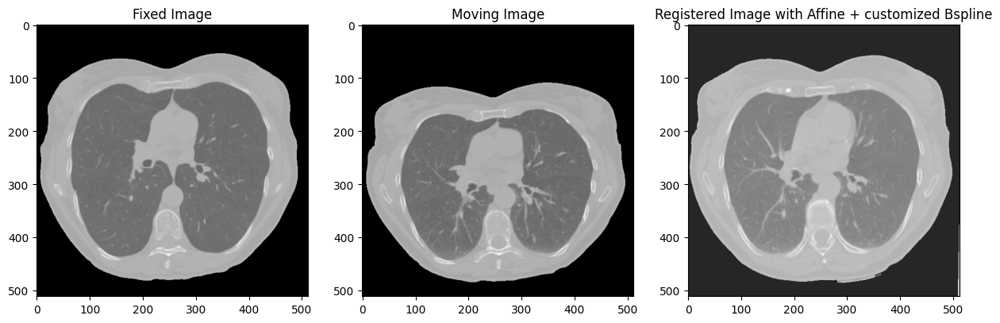

Output points extracted and saved to C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\outseg\copd2_300_iBH_xyz_r1\copd2_300_iBH_xyz_r1.txt


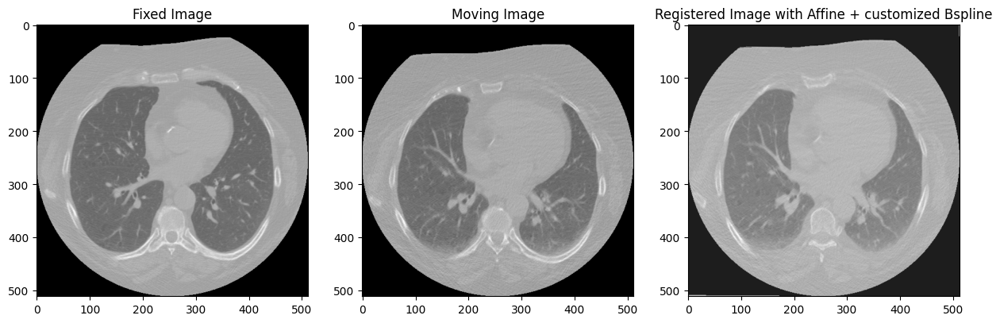

Output points extracted and saved to C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\outseg\copd3_300_iBH_xyz_r1\copd3_300_iBH_xyz_r1.txt


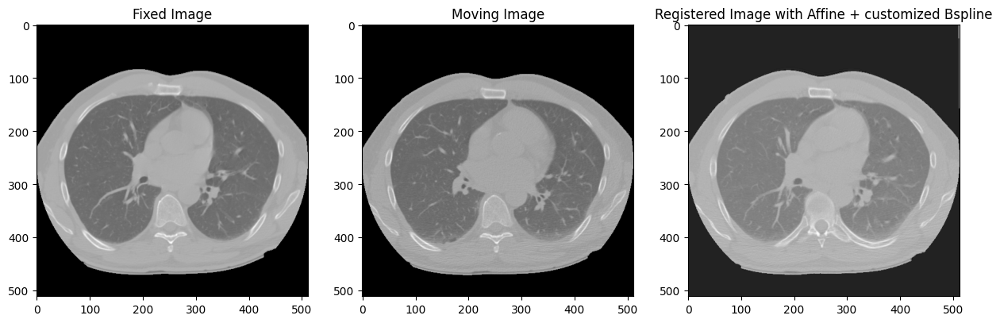

Output points extracted and saved to C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\outseg\copd4_300_iBH_xyz_r1\copd4_300_iBH_xyz_r1.txt


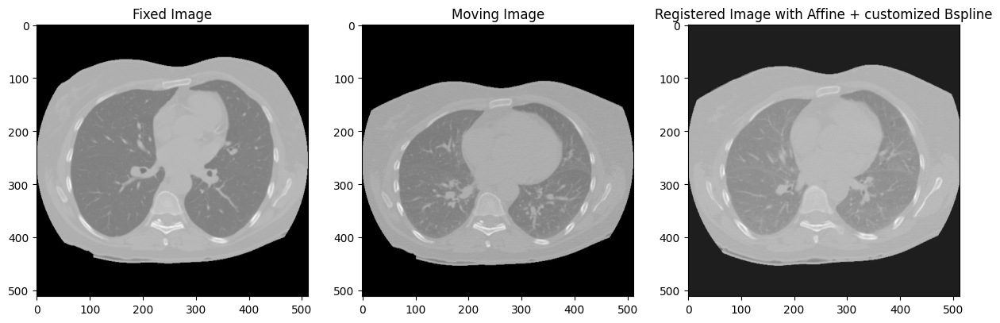

In [35]:
# Iterate over each fixed image in the list
for fixed_image_name in file_list:
    # Construct the file paths for fixed and moving images
    fixed_image_path = os.path.join(input_directory, fixed_image_name)
    moving_image_path = os.path.join(input_directory, fixed_image_name.replace('_iBHCT', '_eBHCT'))

    # Extract case name from the fixed image name
    case_name = fixed_image_name.split('_')[0]

    # Create the output subfolder structure
    output_subfolder = os.path.join(output_directory, '{}_300_iBH_xyz_r1'.format(case_name))
    os.makedirs(output_subfolder, exist_ok=True)

    # Read images
    fixed_image = itk.imread(fixed_image_path, itk.F)
    moving_image = itk.imread(moving_image_path, itk.F)

    # Set up parameter object
    parameter_object = itk.ParameterObject.New()
    
    default_rigid_parameter_map = parameter_object.GetDefaultParameterMap('affine')
    parameter_object.AddParameterMap(default_rigid_parameter_map)
    parameter_object.AddParameterFile(r'C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\Parameter\bspline_transform.txt')

    # Call registration function
    result_image, result_transform_parameters = itk.elastix_registration_method(
        fixed_image, moving_image,
        parameter_object=parameter_object,
        log_to_console=False)

    # Perform transformix
    result_point_set = itk.transformix_pointset(
        moving_image, result_transform_parameters,
        fixed_point_set_file_name=os.path.join(input_directory, fixed_image_name.replace('_iBHCT.nii', '_300_iBH_xyz_r1.txt')),
        output_directory=output_subfolder)

    # Clean the output points
    clean_output_points(os.path.join(output_subfolder, 'outputpoints.txt'), os.path.join(output_subfolder, fixed_image_name.replace('_iBHCT.nii', '_300_iBH_xyz_r1.txt')))

    # Visualize the result
    channel_to_display = 60

    fixed_channel_array = itk.GetArrayFromImage(fixed_image)[channel_to_display, :, :]
    moving_channel_array = itk.GetArrayFromImage(moving_image)[channel_to_display, :, :]
    result_channel_array = itk.GetArrayViewFromImage(result_image)[channel_to_display, :, :]

    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(fixed_channel_array, cmap='gray')
    plt.title('Fixed Image')

    plt.subplot(1, 3, 2)
    plt.imshow(moving_channel_array, cmap='gray')
    plt.title('Moving Image')

    plt.subplot(1, 3, 3)
    plt.imshow(result_channel_array, cmap='gray')
    plt.title('Registered Image with Affine + customized Bspline')

    plt.show()


In [36]:
TRE_folder = r'C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\Compare'

voxel_sizes = {
    "copd1": np.array([0.625, 0.625, 2.5]),
    "copd2": np.array([0.645, 0.645, 2.5]),
    "copd3": np.array([0.652, 0.652, 2.5]),
    "copd4": np.array([0.590, 0.590, 2.5]),
}

# Compare landmarks and compute TRE
compare_landmarks(TRE_folder, voxel_sizes)

TRE for copd1:
Mean TRE: 7.51 mm
Std TRE: 6.43 mm

TRE for copd2:
Mean TRE: 8.19 mm
Std TRE: 6.45 mm

TRE for copd3:
Mean TRE: 3.15 mm
Std TRE: 3.62 mm

TRE for copd4:
Mean TRE: 15.29 mm
Std TRE: 11.13 mm



Registration using Par011 Affine + customized Bspline

Output points extracted and saved to C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\outseg\copd1_300_iBH_xyz_r1\copd1_300_iBH_xyz_r1.txt


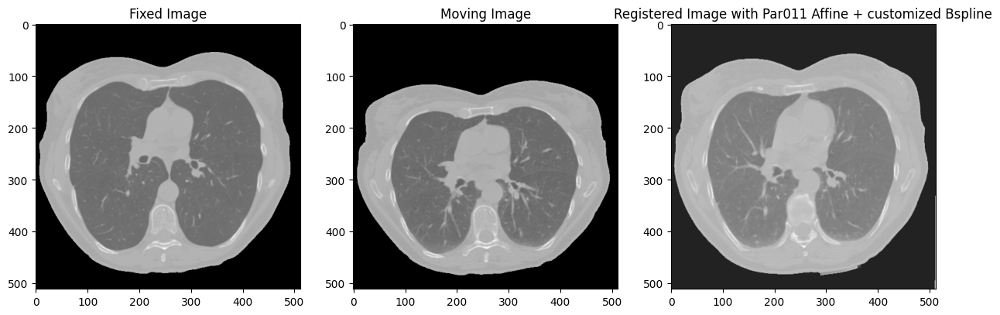

Output points extracted and saved to C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\outseg\copd2_300_iBH_xyz_r1\copd2_300_iBH_xyz_r1.txt


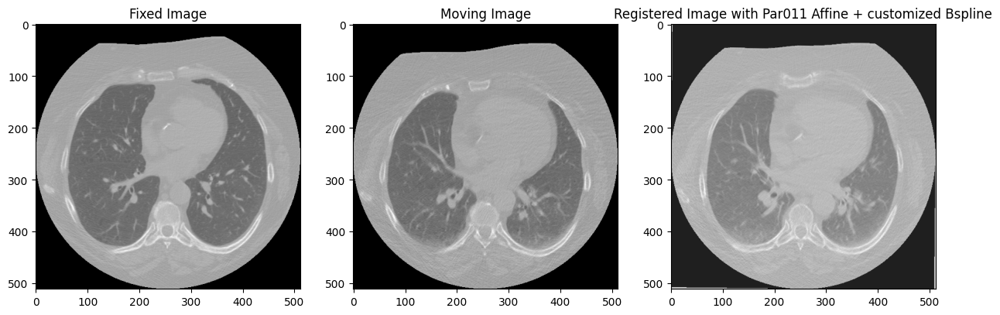

Output points extracted and saved to C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\outseg\copd3_300_iBH_xyz_r1\copd3_300_iBH_xyz_r1.txt


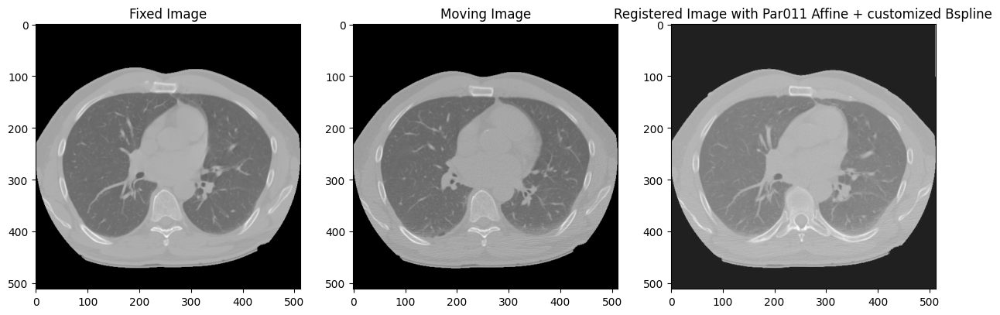

Output points extracted and saved to C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\outseg\copd4_300_iBH_xyz_r1\copd4_300_iBH_xyz_r1.txt


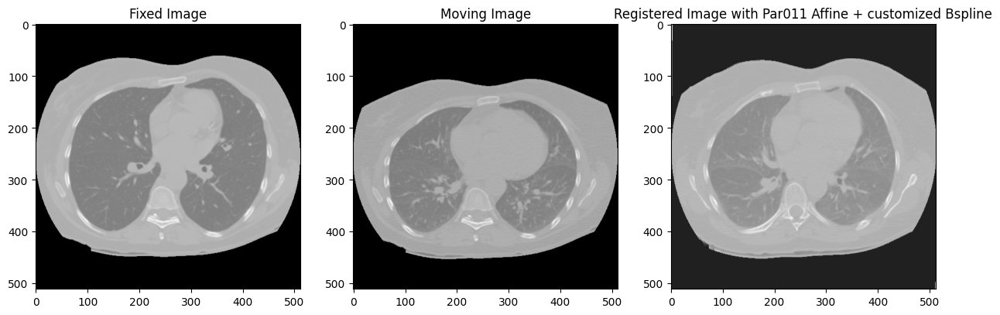

In [37]:
# Iterate over each fixed image in the list
for fixed_image_name in file_list:
    # Construct the file paths for fixed and moving images
    fixed_image_path = os.path.join(input_directory, fixed_image_name)
    moving_image_path = os.path.join(input_directory, fixed_image_name.replace('_iBHCT', '_eBHCT'))

    # Extract case name from the fixed image name
    case_name = fixed_image_name.split('_')[0]

    # Create the output subfolder structure
    output_subfolder = os.path.join(output_directory, '{}_300_iBH_xyz_r1'.format(case_name))
    os.makedirs(output_subfolder, exist_ok=True)

    # Read images
    fixed_image = itk.imread(fixed_image_path, itk.F)
    moving_image = itk.imread(moving_image_path, itk.F)

    # Set up parameter object
    parameter_object = itk.ParameterObject.New()
    
    parameter_object.AddParameterFile(r'C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\Parameter\Parameters.Par0011.affine.txt')
    parameter_object.AddParameterFile(r'C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\Parameter\bspline_transform.txt')

    # Call registration function
    result_image, result_transform_parameters = itk.elastix_registration_method(
        fixed_image, moving_image,
        parameter_object=parameter_object,
        log_to_console=False)

    # Perform transformix
    result_point_set = itk.transformix_pointset(
        moving_image, result_transform_parameters,
        fixed_point_set_file_name=os.path.join(input_directory, fixed_image_name.replace('_iBHCT.nii', '_300_iBH_xyz_r1.txt')),
        output_directory=output_subfolder)

    # Clean the output points
    clean_output_points(os.path.join(output_subfolder, 'outputpoints.txt'), os.path.join(output_subfolder, fixed_image_name.replace('_iBHCT.nii', '_300_iBH_xyz_r1.txt')))

    # Visualize the result
    channel_to_display = 60

    fixed_channel_array = itk.GetArrayFromImage(fixed_image)[channel_to_display, :, :]
    moving_channel_array = itk.GetArrayFromImage(moving_image)[channel_to_display, :, :]
    result_channel_array = itk.GetArrayViewFromImage(result_image)[channel_to_display, :, :]

    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(fixed_channel_array, cmap='gray')
    plt.title('Fixed Image')

    plt.subplot(1, 3, 2)
    plt.imshow(moving_channel_array, cmap='gray')
    plt.title('Moving Image')

    plt.subplot(1, 3, 3)
    plt.imshow(result_channel_array, cmap='gray')
    plt.title('Registered Image with Par011 Affine + customized Bspline')

    plt.show()

In [38]:
TRE_folder = r'C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\Compare'

voxel_sizes = {
    "copd1": np.array([0.625, 0.625, 2.5]),
    "copd2": np.array([0.645, 0.645, 2.5]),
    "copd3": np.array([0.652, 0.652, 2.5]),
    "copd4": np.array([0.590, 0.590, 2.5]),
}

# Compare landmarks and compute TRE
compare_landmarks(TRE_folder, voxel_sizes)

TRE for copd1:
Mean TRE: 7.31 mm
Std TRE: 6.39 mm

TRE for copd2:
Mean TRE: 8.43 mm
Std TRE: 6.93 mm

TRE for copd3:
Mean TRE: 3.08 mm
Std TRE: 3.50 mm

TRE for copd4:
Mean TRE: 8.58 mm
Std TRE: 6.85 mm



Registration using customized Bspline (BSP)

Output points extracted and saved to C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\outseg\copd1_300_iBH_xyz_r1\copd1_300_iBH_xyz_r1.txt


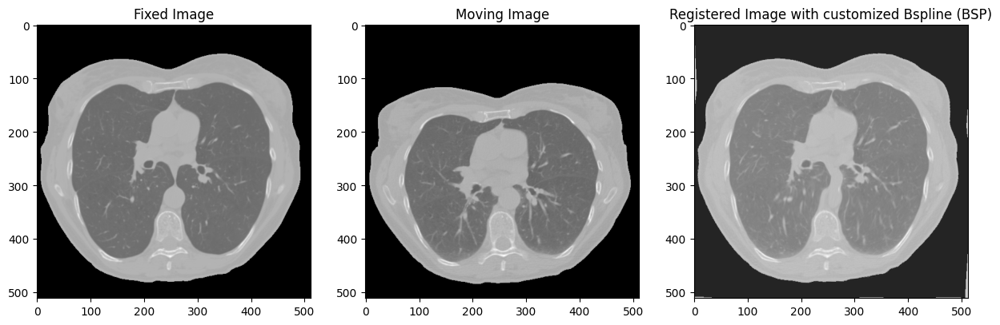

Output points extracted and saved to C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\outseg\copd2_300_iBH_xyz_r1\copd2_300_iBH_xyz_r1.txt


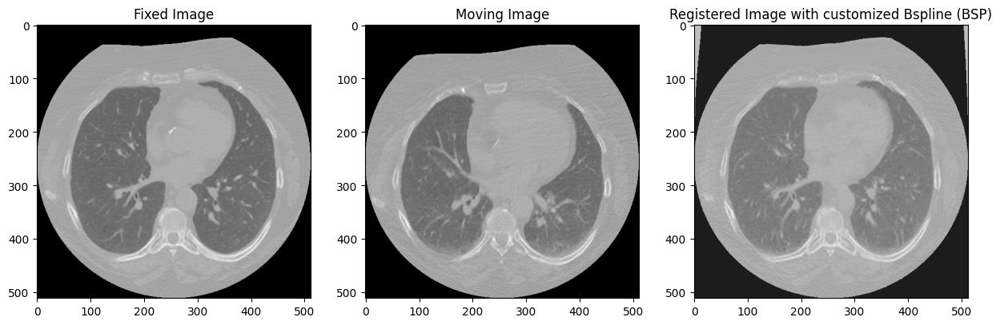

Output points extracted and saved to C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\outseg\copd3_300_iBH_xyz_r1\copd3_300_iBH_xyz_r1.txt


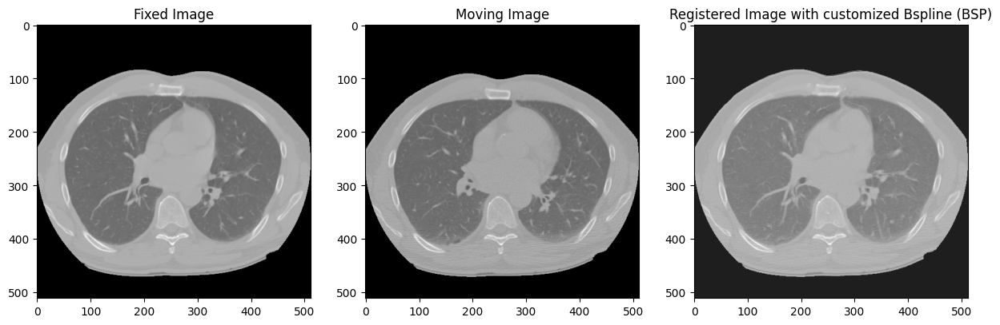

Output points extracted and saved to C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\outseg\copd4_300_iBH_xyz_r1\copd4_300_iBH_xyz_r1.txt


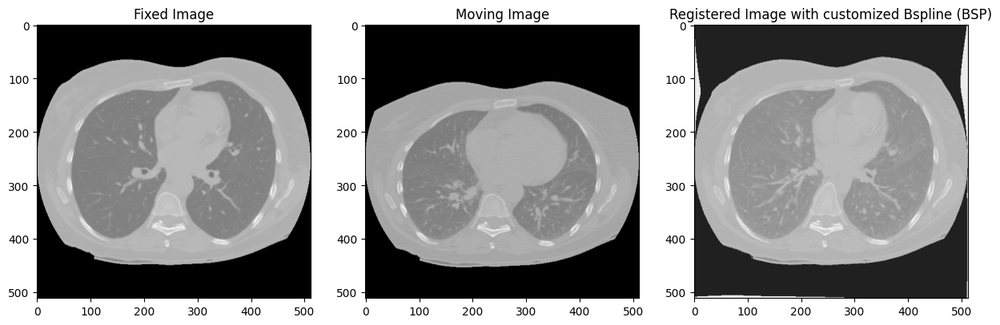

In [39]:
# Iterate over each fixed image in the list
for fixed_image_name in file_list:
    # Construct the file paths for fixed and moving images
    fixed_image_path = os.path.join(input_directory, fixed_image_name)
    moving_image_path = os.path.join(input_directory, fixed_image_name.replace('_iBHCT', '_eBHCT'))

    # Extract case name from the fixed image name
    case_name = fixed_image_name.split('_')[0]

    # Create the output subfolder structure
    output_subfolder = os.path.join(output_directory, '{}_300_iBH_xyz_r1'.format(case_name))
    os.makedirs(output_subfolder, exist_ok=True)

    # Read images
    fixed_image = itk.imread(fixed_image_path, itk.F)
    moving_image = itk.imread(moving_image_path, itk.F)

    # Set up parameter object
    parameter_object = itk.ParameterObject.New()
 
    parameter_object.AddParameterFile(r'C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\Parameter\BSP.txt')

    # Call registration function
    result_image, result_transform_parameters = itk.elastix_registration_method(
        fixed_image, moving_image,
        parameter_object=parameter_object,
        log_to_console=False)

    # Perform transformix
    result_point_set = itk.transformix_pointset(
        moving_image, result_transform_parameters,
        fixed_point_set_file_name=os.path.join(input_directory, fixed_image_name.replace('_iBHCT.nii', '_300_iBH_xyz_r1.txt')),
        output_directory=output_subfolder)

    # Clean the output points
    clean_output_points(os.path.join(output_subfolder, 'outputpoints.txt'), os.path.join(output_subfolder, fixed_image_name.replace('_iBHCT.nii', '_300_iBH_xyz_r1.txt')))

    # Visualize the result
    channel_to_display = 60

    fixed_channel_array = itk.GetArrayFromImage(fixed_image)[channel_to_display, :, :]
    moving_channel_array = itk.GetArrayFromImage(moving_image)[channel_to_display, :, :]
    result_channel_array = itk.GetArrayViewFromImage(result_image)[channel_to_display, :, :]

    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(fixed_channel_array, cmap='gray')
    plt.title('Fixed Image')

    plt.subplot(1, 3, 2)
    plt.imshow(moving_channel_array, cmap='gray')
    plt.title('Moving Image')

    plt.subplot(1, 3, 3)
    plt.imshow(result_channel_array, cmap='gray')
    plt.title('Registered Image with customized Bspline (BSP)')

    plt.show()

In [40]:
TRE_folder = r'C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\Compare'

voxel_sizes = {
    "copd1": np.array([0.625, 0.625, 2.5]),
    "copd2": np.array([0.645, 0.645, 2.5]),
    "copd3": np.array([0.652, 0.652, 2.5]),
    "copd4": np.array([0.590, 0.590, 2.5]),
}

# Compare landmarks and compute TRE
compare_landmarks(TRE_folder, voxel_sizes)

TRE for copd1:
Mean TRE: 8.03 mm
Std TRE: 6.60 mm

TRE for copd2:
Mean TRE: 8.61 mm
Std TRE: 6.40 mm

TRE for copd3:
Mean TRE: 3.14 mm
Std TRE: 3.57 mm

TRE for copd4:
Mean TRE: 18.00 mm
Std TRE: 12.23 mm



Registration using Par07 (Coarse and Fine Bspline)

Output points extracted and saved to C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\outseg\copd1_300_iBH_xyz_r1\copd1_300_iBH_xyz_r1.txt


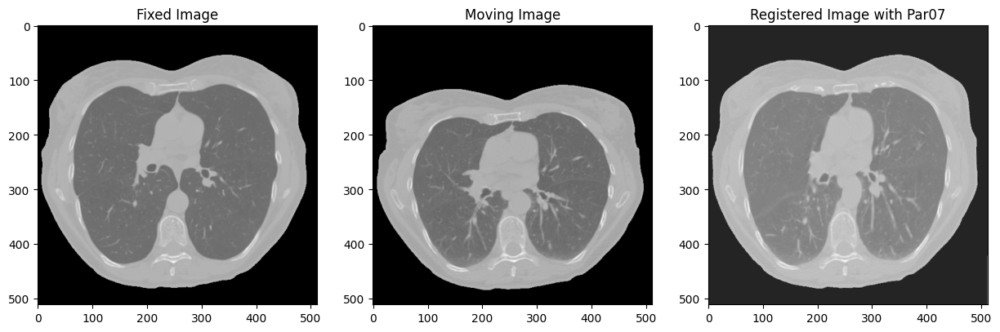

Output points extracted and saved to C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\outseg\copd2_300_iBH_xyz_r1\copd2_300_iBH_xyz_r1.txt


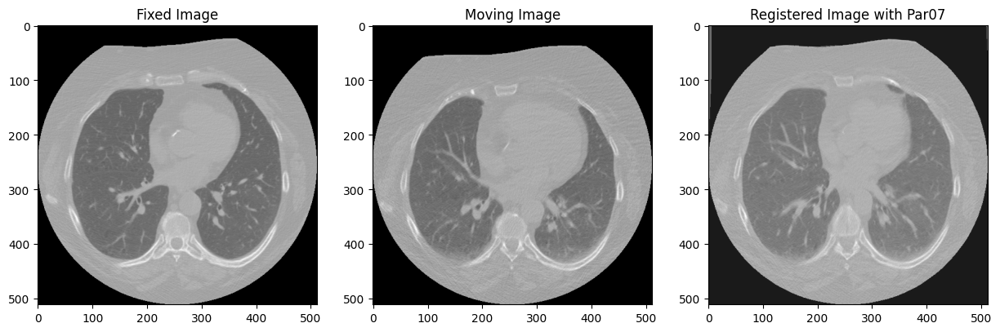

Output points extracted and saved to C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\outseg\copd3_300_iBH_xyz_r1\copd3_300_iBH_xyz_r1.txt


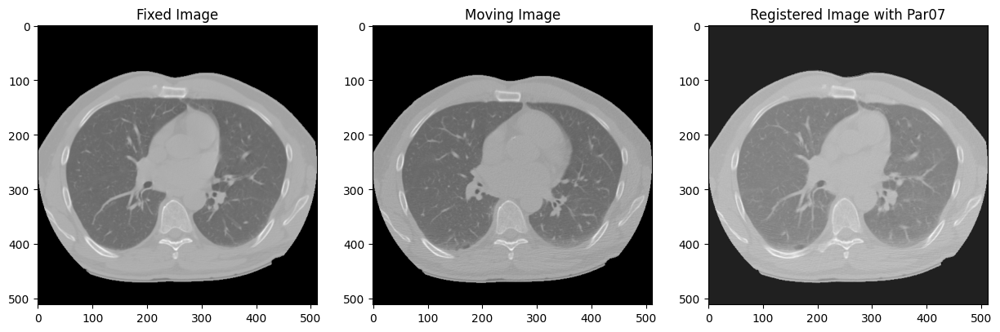

Output points extracted and saved to C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\outseg\copd4_300_iBH_xyz_r1\copd4_300_iBH_xyz_r1.txt


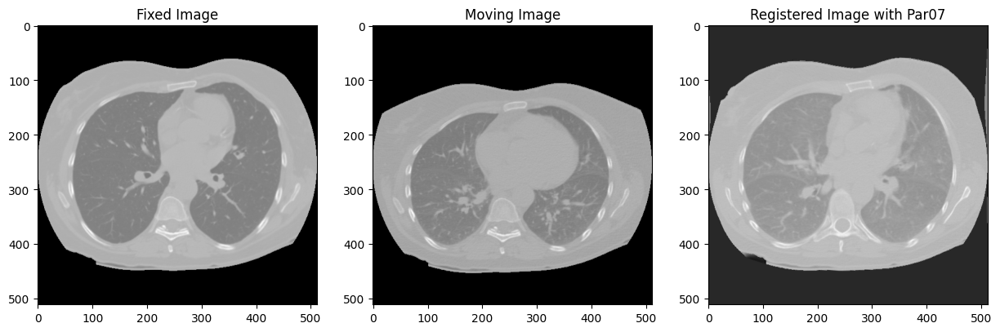

In [41]:
# Iterate over each fixed image in the list
for fixed_image_name in file_list:
    # Construct the file paths for fixed and moving images
    fixed_image_path = os.path.join(input_directory, fixed_image_name)
    moving_image_path = os.path.join(input_directory, fixed_image_name.replace('_iBHCT', '_eBHCT'))

    # Extract case name from the fixed image name
    case_name = fixed_image_name.split('_')[0]

    # Create the output subfolder structure
    output_subfolder = os.path.join(output_directory, '{}_300_iBH_xyz_r1'.format(case_name))
    os.makedirs(output_subfolder, exist_ok=True)

    # Read images
    fixed_image = itk.imread(fixed_image_path, itk.F)
    moving_image = itk.imread(moving_image_path, itk.F)

    # Set up parameter object
    parameter_object = itk.ParameterObject.New()
 
    parameter_object.AddParameterFile(r'C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\Parameter\Parameters.MI.Coarse.Bspline_tuned.txt')
    parameter_object.AddParameterFile(r'C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\Parameter\Parameters.MI.Fine.Bspline_tuned.txt')

    # Call registration function
    result_image, result_transform_parameters = itk.elastix_registration_method(
        fixed_image, moving_image,
        parameter_object=parameter_object,
        log_to_console=False)

    # Perform transformix
    result_point_set = itk.transformix_pointset(
        moving_image, result_transform_parameters,
        fixed_point_set_file_name=os.path.join(input_directory, fixed_image_name.replace('_iBHCT.nii', '_300_iBH_xyz_r1.txt')),
        output_directory=output_subfolder)

    # Clean the output points
    clean_output_points(os.path.join(output_subfolder, 'outputpoints.txt'), os.path.join(output_subfolder, fixed_image_name.replace('_iBHCT.nii', '_300_iBH_xyz_r1.txt')))

    # Visualize the result
    channel_to_display = 60

    fixed_channel_array = itk.GetArrayFromImage(fixed_image)[channel_to_display, :, :]
    moving_channel_array = itk.GetArrayFromImage(moving_image)[channel_to_display, :, :]
    result_channel_array = itk.GetArrayViewFromImage(result_image)[channel_to_display, :, :]

    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(fixed_channel_array, cmap='gray')
    plt.title('Fixed Image')

    plt.subplot(1, 3, 2)
    plt.imshow(moving_channel_array, cmap='gray')
    plt.title('Moving Image')

    plt.subplot(1, 3, 3)
    plt.imshow(result_channel_array, cmap='gray')
    plt.title('Registered Image with Par07')

    plt.show()

In [42]:
TRE_folder = r'C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\Compare'

voxel_sizes = {
    "copd1": np.array([0.625, 0.625, 2.5]),
    "copd2": np.array([0.645, 0.645, 2.5]),
    "copd3": np.array([0.652, 0.652, 2.5]),
    "copd4": np.array([0.590, 0.590, 2.5]),
}

# Compare landmarks and compute TRE
compare_landmarks(TRE_folder, voxel_sizes)

TRE for copd1:
Mean TRE: 10.97 mm
Std TRE: 5.85 mm

TRE for copd2:
Mean TRE: 14.57 mm
Std TRE: 6.64 mm

TRE for copd3:
Mean TRE: 5.13 mm
Std TRE: 3.38 mm

TRE for copd4:
Mean TRE: 12.02 mm
Std TRE: 4.30 mm



Registration using customized Bspline, and Bspline (BSP)

Output points extracted and saved to C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\outseg\copd1_300_iBH_xyz_r1\copd1_300_iBH_xyz_r1.txt


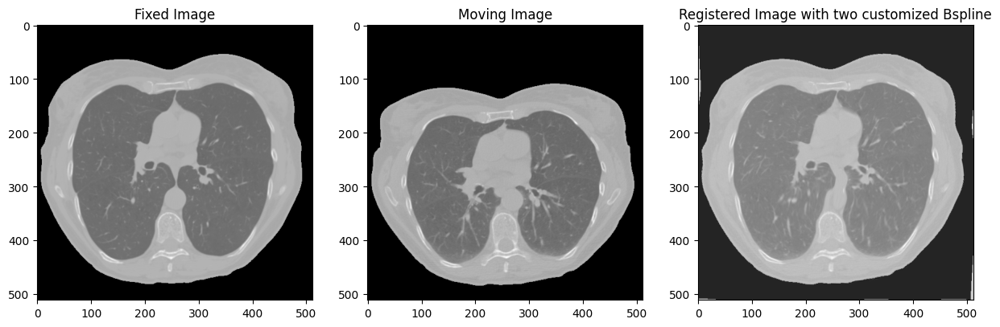

Output points extracted and saved to C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\outseg\copd2_300_iBH_xyz_r1\copd2_300_iBH_xyz_r1.txt


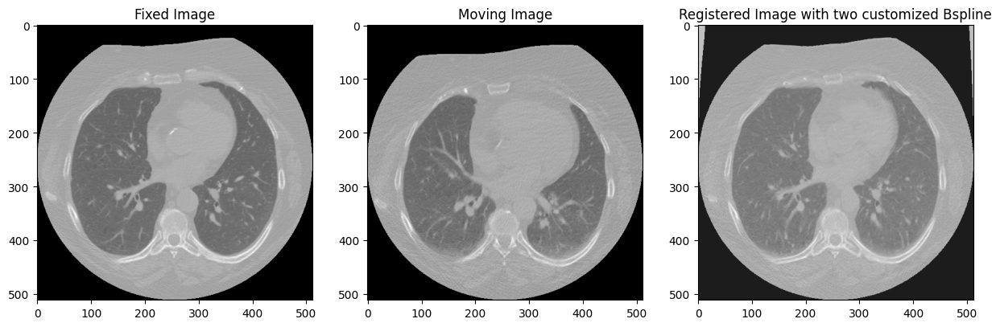

Output points extracted and saved to C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\outseg\copd3_300_iBH_xyz_r1\copd3_300_iBH_xyz_r1.txt


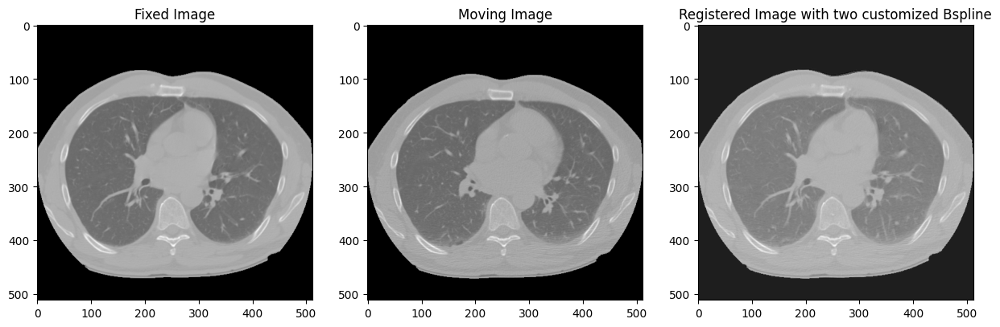

Output points extracted and saved to C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\outseg\copd4_300_iBH_xyz_r1\copd4_300_iBH_xyz_r1.txt


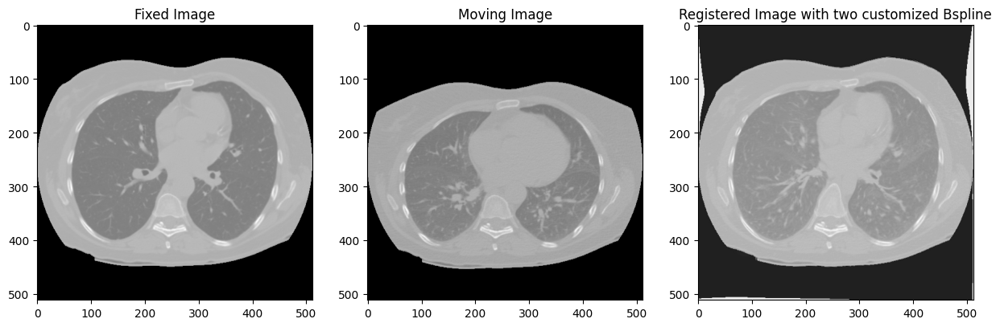

In [43]:
# Iterate over each fixed image in the list
for fixed_image_name in file_list:
    # Construct the file paths for fixed and moving images
    fixed_image_path = os.path.join(input_directory, fixed_image_name)
    moving_image_path = os.path.join(input_directory, fixed_image_name.replace('_iBHCT', '_eBHCT'))

    # Extract case name from the fixed image name
    case_name = fixed_image_name.split('_')[0]

    # Create the output subfolder structure
    output_subfolder = os.path.join(output_directory, '{}_300_iBH_xyz_r1'.format(case_name))
    os.makedirs(output_subfolder, exist_ok=True)

    # Read images
    fixed_image = itk.imread(fixed_image_path, itk.F)
    moving_image = itk.imread(moving_image_path, itk.F)

    # Set up parameter object
    parameter_object = itk.ParameterObject.New()
 
    parameter_object.AddParameterFile(r'C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\Parameter\BSP.txt')
    parameter_object.AddParameterFile(r'C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\Parameter\bspline_transform.txt')

    # Call registration function
    result_image, result_transform_parameters = itk.elastix_registration_method(
        fixed_image, moving_image,
        parameter_object=parameter_object,
        log_to_console=False)

    # Perform transformix
    result_point_set = itk.transformix_pointset(
        moving_image, result_transform_parameters,
        fixed_point_set_file_name=os.path.join(input_directory, fixed_image_name.replace('_iBHCT.nii', '_300_iBH_xyz_r1.txt')),
        output_directory=output_subfolder)

    # Clean the output points
    clean_output_points(os.path.join(output_subfolder, 'outputpoints.txt'), os.path.join(output_subfolder, fixed_image_name.replace('_iBHCT.nii', '_300_iBH_xyz_r1.txt')))

    # Visualize the result
    channel_to_display = 60

    fixed_channel_array = itk.GetArrayFromImage(fixed_image)[channel_to_display, :, :]
    moving_channel_array = itk.GetArrayFromImage(moving_image)[channel_to_display, :, :]
    result_channel_array = itk.GetArrayViewFromImage(result_image)[channel_to_display, :, :]

    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(fixed_channel_array, cmap='gray')
    plt.title('Fixed Image')

    plt.subplot(1, 3, 2)
    plt.imshow(moving_channel_array, cmap='gray')
    plt.title('Moving Image')

    plt.subplot(1, 3, 3)
    plt.imshow(result_channel_array, cmap='gray')
    plt.title('Registered Image with two customized Bspline')

    plt.show()

In [44]:
TRE_folder = r'C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\Compare'

voxel_sizes = {
    "copd1": np.array([0.625, 0.625, 2.5]),
    "copd2": np.array([0.645, 0.645, 2.5]),
    "copd3": np.array([0.652, 0.652, 2.5]),
    "copd4": np.array([0.590, 0.590, 2.5]),
}

# Compare landmarks and compute TRE
compare_landmarks(TRE_folder, voxel_sizes)

TRE for copd1:
Mean TRE: 7.63 mm
Std TRE: 6.66 mm

TRE for copd2:
Mean TRE: 8.51 mm
Std TRE: 6.63 mm

TRE for copd3:
Mean TRE: 2.99 mm
Std TRE: 3.45 mm

TRE for copd4:
Mean TRE: 17.86 mm
Std TRE: 12.11 mm



#### COMBINE ALL BEST PARAMETER FILES

Output points extracted and saved to C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\outseg\copd1_300_iBH_xyz_r1\copd1_300_iBH_xyz_r1.txt


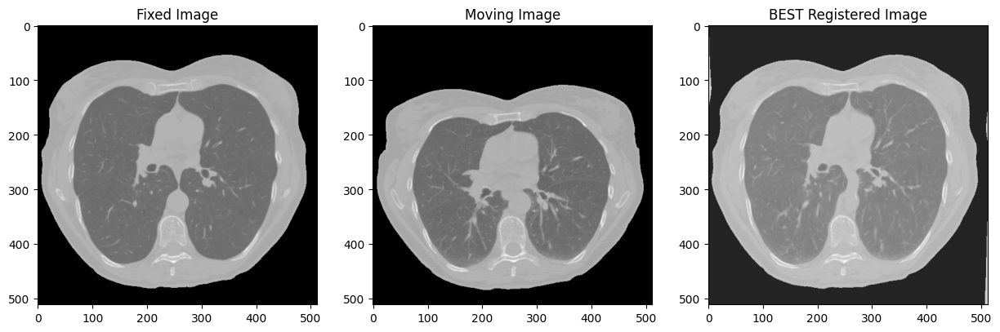

Output points extracted and saved to C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\outseg\copd2_300_iBH_xyz_r1\copd2_300_iBH_xyz_r1.txt


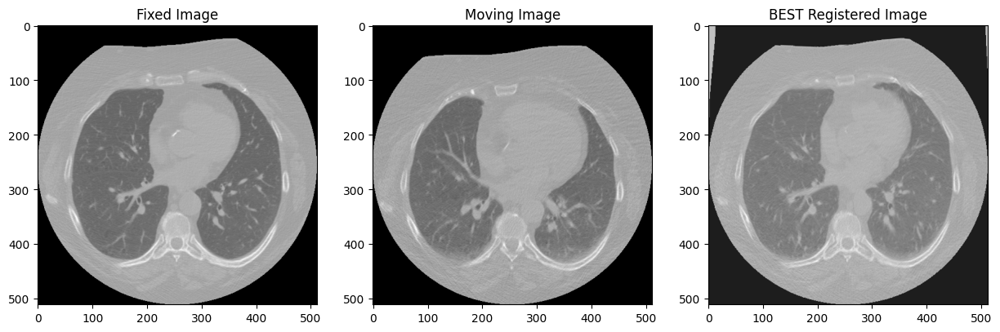

Output points extracted and saved to C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\outseg\copd3_300_iBH_xyz_r1\copd3_300_iBH_xyz_r1.txt


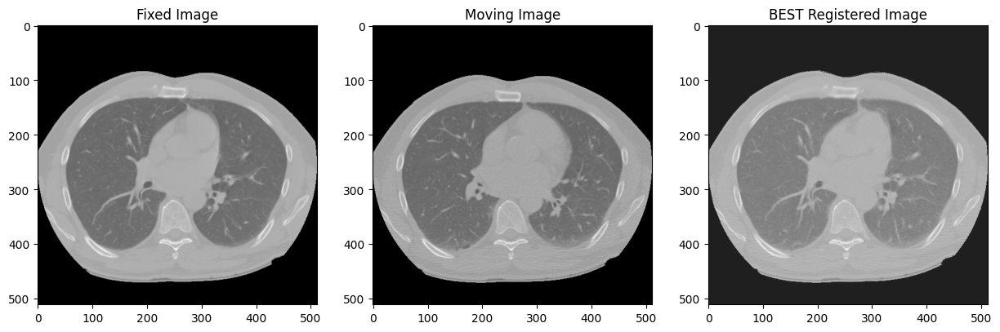

Output points extracted and saved to C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\outseg\copd4_300_iBH_xyz_r1\copd4_300_iBH_xyz_r1.txt


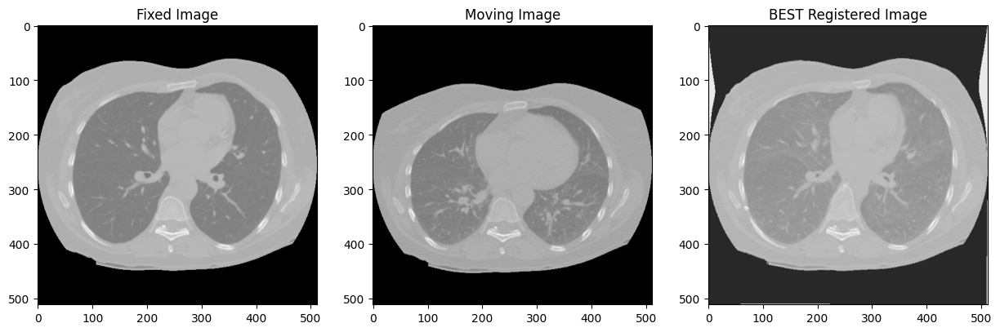

In [45]:
# Iterate over each fixed image in the list
for fixed_image_name in file_list:
    # Construct the file paths for fixed and moving images
    fixed_image_path = os.path.join(input_directory, fixed_image_name)
    moving_image_path = os.path.join(input_directory, fixed_image_name.replace('_iBHCT', '_eBHCT'))

    # Extract case name from the fixed image name
    case_name = fixed_image_name.split('_')[0]

    # Create the output subfolder structure
    output_subfolder = os.path.join(output_directory, '{}_300_iBH_xyz_r1'.format(case_name))
    os.makedirs(output_subfolder, exist_ok=True)

    # Read images
    fixed_image = itk.imread(fixed_image_path, itk.F)
    moving_image = itk.imread(moving_image_path, itk.F)

    # Set up parameter object
    parameter_object = itk.ParameterObject.New()
 
    parameter_object.AddParameterFile(r'C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\Parameter\Parameters.Par0011.affine.txt')
    parameter_object.AddParameterFile(r'C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\Parameter\BSP.txt')
    parameter_object.AddParameterFile(r'C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\Parameter\bspline_transform.txt')
    

    # Call registration function
    result_image, result_transform_parameters = itk.elastix_registration_method(
        fixed_image, moving_image,
        parameter_object=parameter_object,
        log_to_console=False)

    # Perform transformix
    result_point_set = itk.transformix_pointset(
        moving_image, result_transform_parameters,
        fixed_point_set_file_name=os.path.join(input_directory, fixed_image_name.replace('_iBHCT.nii', '_300_iBH_xyz_r1.txt')),
        output_directory=output_subfolder)

    # Clean the output points
    clean_output_points(os.path.join(output_subfolder, 'outputpoints.txt'), os.path.join(output_subfolder, fixed_image_name.replace('_iBHCT.nii', '_300_iBH_xyz_r1.txt')))

    # Visualize the result
    channel_to_display = 60

    fixed_channel_array = itk.GetArrayFromImage(fixed_image)[channel_to_display, :, :]
    moving_channel_array = itk.GetArrayFromImage(moving_image)[channel_to_display, :, :]
    result_channel_array = itk.GetArrayViewFromImage(result_image)[channel_to_display, :, :]

    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(fixed_channel_array, cmap='gray')
    plt.title('Fixed Image')

    plt.subplot(1, 3, 2)
    plt.imshow(moving_channel_array, cmap='gray')
    plt.title('Moving Image')

    plt.subplot(1, 3, 3)
    plt.imshow(result_channel_array, cmap='gray')
    plt.title('BEST Registered Image')

    plt.show()

In [46]:
TRE_folder = r'C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\Compare'

voxel_sizes = {
    "copd1": np.array([0.625, 0.625, 2.5]),
    "copd2": np.array([0.645, 0.645, 2.5]),
    "copd3": np.array([0.652, 0.652, 2.5]),
    "copd4": np.array([0.590, 0.590, 2.5]),
}

# Compare landmarks and compute TRE
compare_landmarks(TRE_folder, voxel_sizes)

TRE for copd1:
Mean TRE: 6.87 mm
Std TRE: 6.39 mm

TRE for copd2:
Mean TRE: 8.33 mm
Std TRE: 7.29 mm

TRE for copd3:
Mean TRE: 2.94 mm
Std TRE: 3.41 mm

TRE for copd4:
Mean TRE: 8.59 mm
Std TRE: 6.82 mm



TESTING

Convert to nii

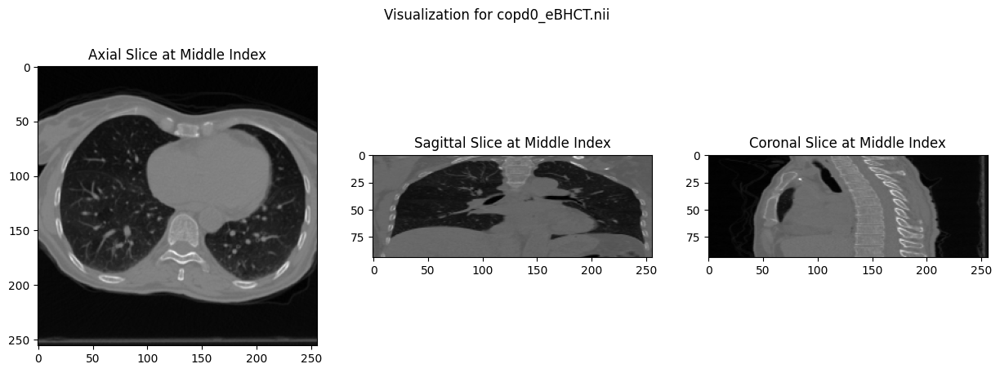

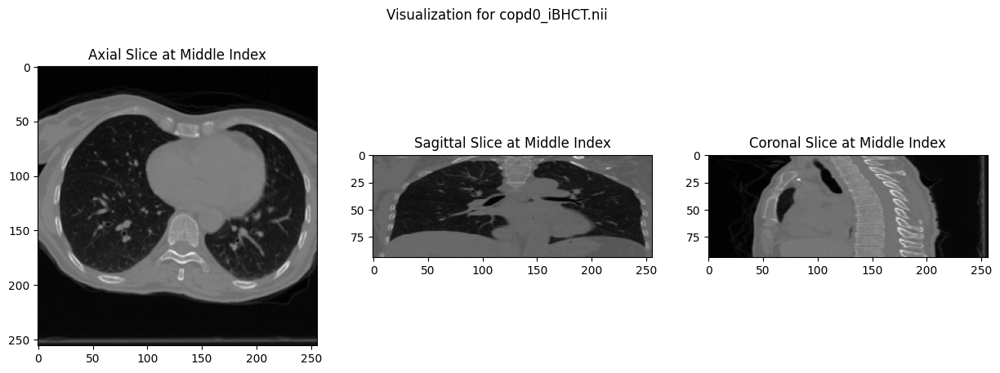

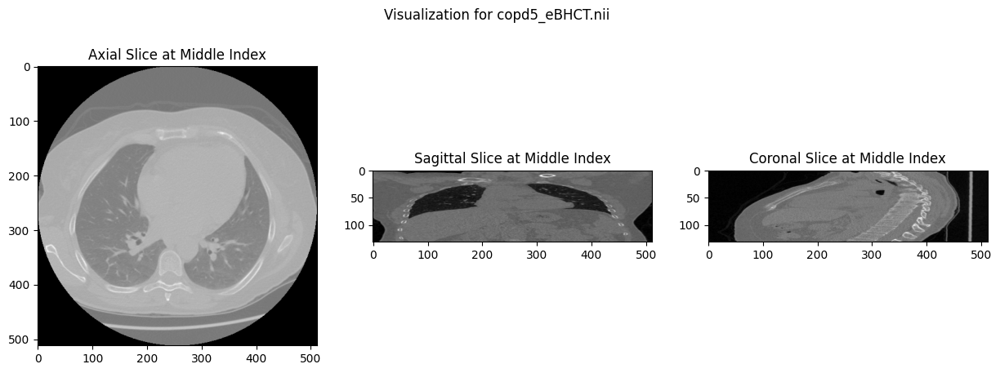

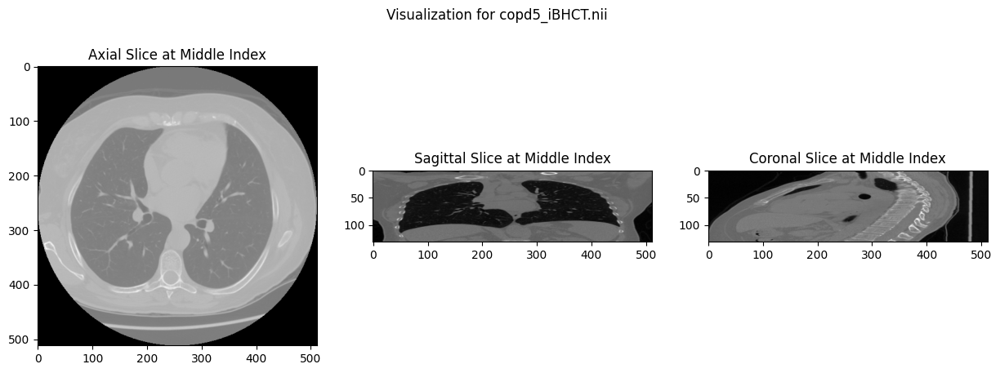

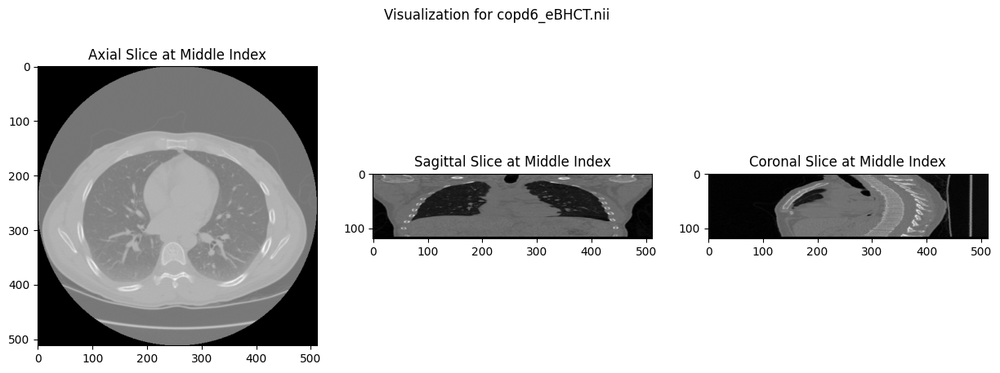

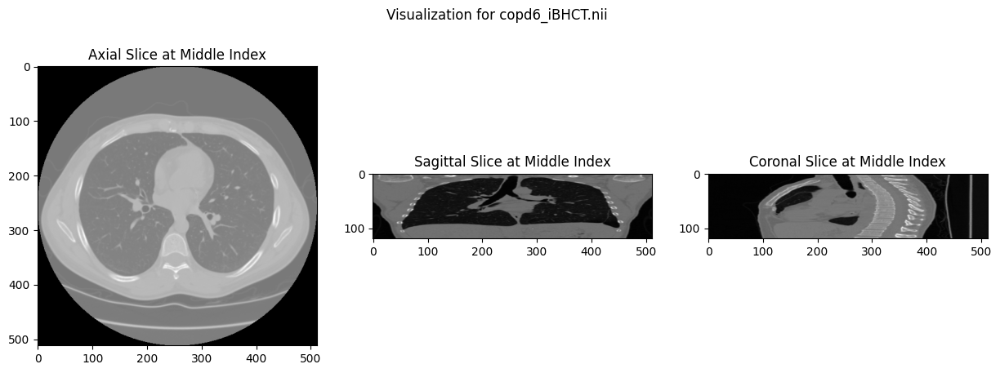

In [3]:
# Provide the needed paths for our class
folder1 = r"C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\Parameter\challengeDay2122\copd0"
folder2 = r"C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\Parameter\challengeDay2122\copd5"
folder3 = r"C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\Parameter\challengeDay2122\copd6"

output = r"C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\Test_files"

# Instance of the RawToITKConverter class
converter = RawToITKConverter()

# Convert all .img files in the folders to nifty
converter.convert_raw_files_to_nifti(folder1, output, image_size=(256, 256, 94))
converter.convert_raw_files_to_nifti(folder2, output, image_size=(512, 512, 131))
converter.convert_raw_files_to_nifti(folder3, output, image_size=(512, 512, 119))

# Visualize all positions
converter.visualize_all_position(output)

Test preprocessing


Fov presence: False


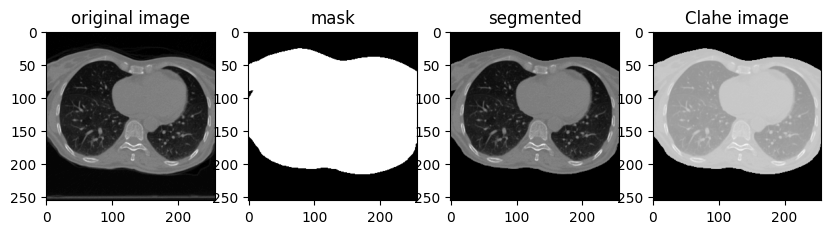


Fov presence: False


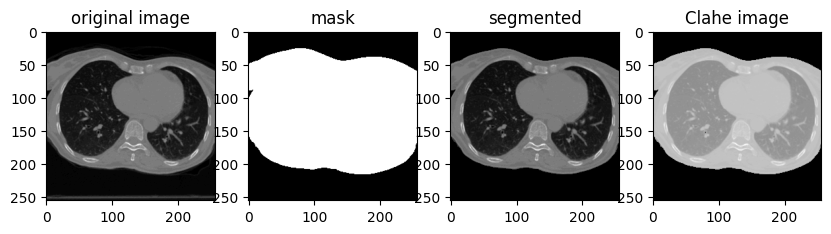


Fov presence: True


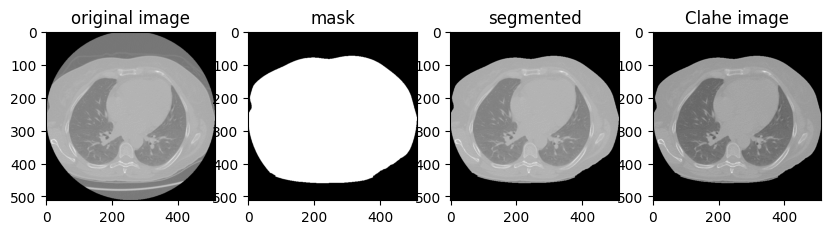


Fov presence: True


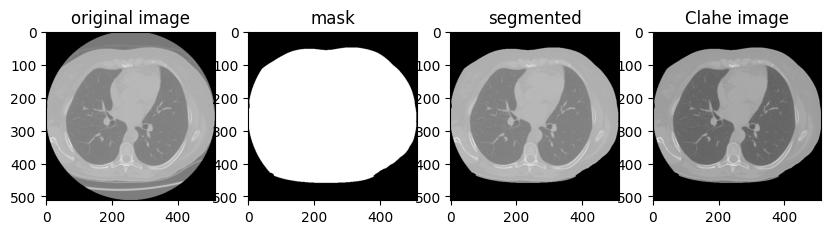


Fov presence: True


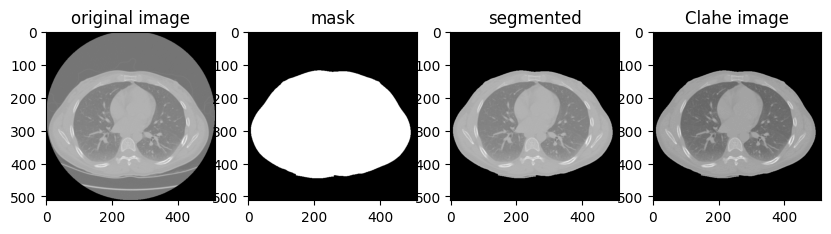


Fov presence: True


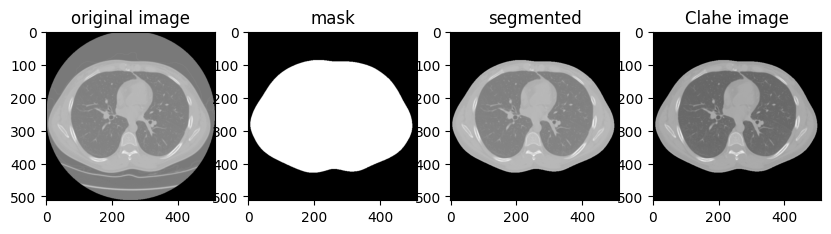

In [4]:
removedG_folder = r'C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\Test_preprocessed'
output_folder = r"C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\Test_files"

# Instance of CTPreprocessing
ct_preprocessor = CTPreprocessing(output_folder, removedG_folder)

nii_files = [file for file in os.listdir(output_folder) if file.endswith('.nii')]

# Process each file and perform all preprocessing
for nii_file in nii_files:
    input_path = os.path.join(output_folder, nii_file)

    ct_image = sitk.ReadImage(input_path)
    img_255 = sitk.Cast(sitk.RescaleIntensity(ct_image), sitk.sitkUInt8)
    seg_img = sitk.GetArrayFromImage(img_255)

    if ct_preprocessor.check_fov(sitk.GetArrayFromImage(ct_image)):
        segmented = ct_preprocessor.segment_kmeans(seg_img)
        print("\nFov presence: True")
    else:
        segmented = ct_preprocessor.segment_kmeans(seg_img, K=2)
        print("\nFov presence: False")

    removed, gantry_mask = ct_preprocessor.remove_gantry(seg_img, segmented)
    preprocessed = ct_preprocessor.apply_CLAHE(removed)

    
    output_path = os.path.join(removedG_folder, nii_file)

    removed_image = sitk.GetImageFromArray(removed)
    preprocessed_image = sitk.GetArrayFromImage(preprocessed)

    # Save the processed image to the removedG folder
    sitk.WriteImage(preprocessed , output_path)

    fig, ax = plt.subplots(1, 4, figsize=(10, 5))

    ax[0].imshow(seg_img[60, :, :], cmap="gray")
    ax[0].set_title("original image")

    ax[1].imshow(gantry_mask[60, :, :], cmap="gray")
    ax[1].set_title("mask")

    ax[2].imshow(removed[60, :, :], cmap="gray")
    ax[2].set_title("segmented")

    ax[3].imshow(preprocessed_image[60, :, :], cmap="gray")
    ax[3].set_title("Clahe image")

    plt.show()

Register

Output points extracted and saved to C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\testOutput\copd0_300_iBH_xyz_r1\copd0_300_iBH_xyz_r1.txt


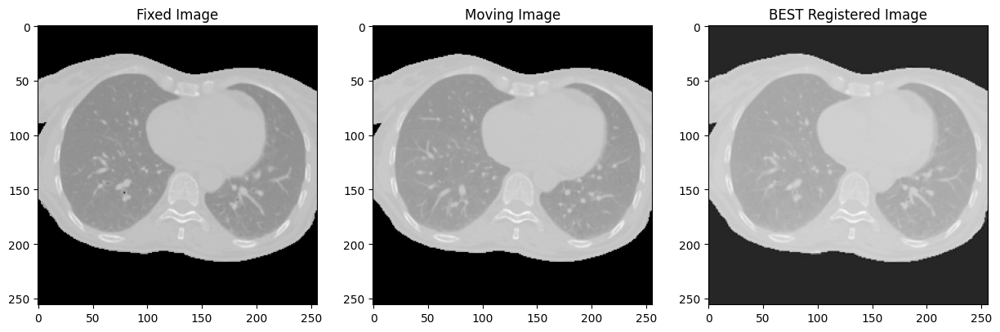

Output points extracted and saved to C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\testOutput\copd5_300_iBH_xyz_r1\copd5_300_iBH_xyz_r1.txt


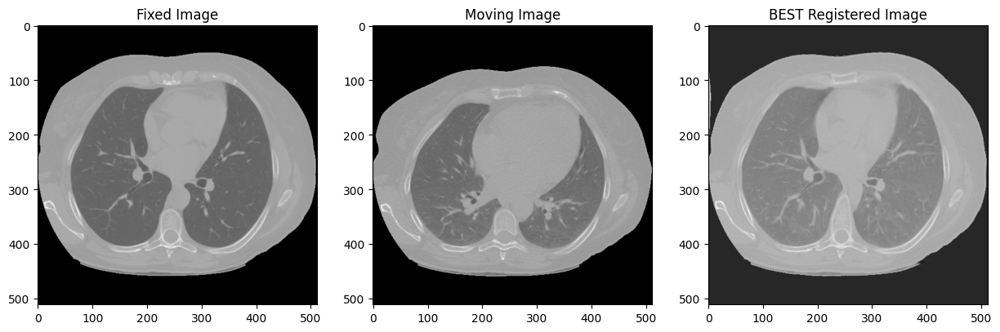

Output points extracted and saved to C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\testOutput\copd6_300_iBH_xyz_r1\copd6_300_iBH_xyz_r1.txt


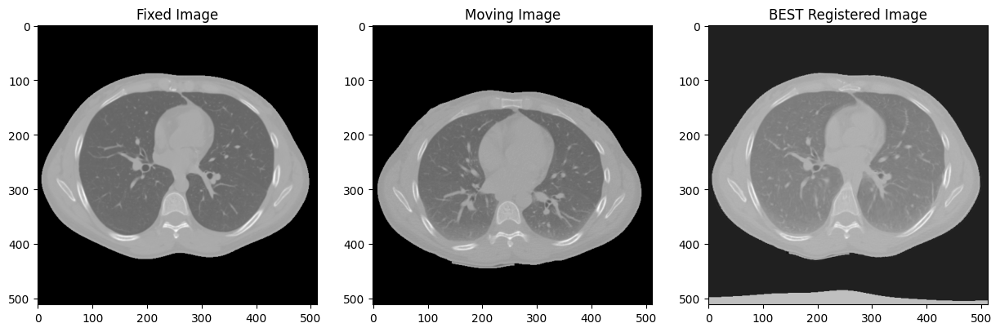

In [6]:
# Define the input and output directories
input_directory = r'C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\Test_preprocessed'
output_directory = r'C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\testOutput'

# Get a list of all files in the input directory
file_list = [f for f in os.listdir(input_directory) if f.endswith('_iBHCT.nii')]

# Iterate over each fixed image in the list
for fixed_image_name in file_list:
    # Construct the file paths for fixed and moving images
    fixed_image_path = os.path.join(input_directory, fixed_image_name)
    moving_image_path = os.path.join(input_directory, fixed_image_name.replace('_iBHCT', '_eBHCT'))

    # Extract case name from the fixed image name
    case_name = fixed_image_name.split('_')[0]

    # Create the output subfolder structure
    output_subfolder = os.path.join(output_directory, '{}_300_iBH_xyz_r1'.format(case_name))
    os.makedirs(output_subfolder, exist_ok=True)

    # Read images
    fixed_image = itk.imread(fixed_image_path, itk.F)
    moving_image = itk.imread(moving_image_path, itk.F)

    # Set up parameter object
    parameter_object = itk.ParameterObject.New()
 
    parameter_object.AddParameterFile(r'C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\Parameter\Parameters.Par0011.affine.txt')
    parameter_object.AddParameterFile(r'C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\Parameter\BSP.txt')
    parameter_object.AddParameterFile(r'C:\Users\sulei\Downloads\MAIA Girona\MIRA\Project\train12\Parameter\bspline_transform.txt')
    

    # Call registration function
    result_image, result_transform_parameters = itk.elastix_registration_method(
        fixed_image, moving_image,
        parameter_object=parameter_object,
        log_to_console=False)

    # Perform transformix
    result_point_set = itk.transformix_pointset(
        moving_image, result_transform_parameters,
        fixed_point_set_file_name=os.path.join(input_directory, fixed_image_name.replace('_iBHCT.nii', '_300_iBH_xyz_r1.txt')),
        output_directory=output_subfolder)

    # Clean the output points
    clean_output_points(os.path.join(output_subfolder, 'outputpoints.txt'), os.path.join(output_subfolder, fixed_image_name.replace('_iBHCT.nii', '_300_iBH_xyz_r1.txt')))

    # Visualize the result
    channel_to_display = 60

    fixed_channel_array = itk.GetArrayFromImage(fixed_image)[channel_to_display, :, :]
    moving_channel_array = itk.GetArrayFromImage(moving_image)[channel_to_display, :, :]
    result_channel_array = itk.GetArrayViewFromImage(result_image)[channel_to_display, :, :]

    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(fixed_channel_array, cmap='gray')
    plt.title('Fixed Image')

    plt.subplot(1, 3, 2)
    plt.imshow(moving_channel_array, cmap='gray')
    plt.title('Moving Image')

    plt.subplot(1, 3, 3)
    plt.imshow(result_channel_array, cmap='gray')
    plt.title('BEST Registered Image')

    plt.show()